# Non linear feature extraction of the stratosphere

## Set-up: 

### Imports:

In [410]:
from scipy.spatial import distance_matrix
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import sleep
import warnings
from sklearn.neighbors import NearestNeighbors
import scipy.sparse.linalg as linalg
import scipy.signal as signal
import seaborn as sns
import matplotlib.dates as mdates
from datetime import datetime
import os
import math 
warnings.filterwarnings('ignore')

from functions_takens import *

%load_ext jupyternotify
%load_ext autoreload
%autoreload 2

The jupyternotify extension is already loaded. To reload it, use:
  %reload_ext jupyternotify
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Constants:

In [411]:
# Percentage of nearest neighbours for Laplacian eigenmpas:
PERC_NEIGH = 10
print(f'Percentage of nearest neighbours: {PERC_NEIGH/100}')

# Number of eigenmaps to compute:
NUM_EIGENVALUES = 21
print(f'Number of eigenmaps: {NUM_EIGENVALUES}')

# Data set to consider: ('raw/anomalies')
DATA = 'anomalies'
print(f'Data set considered: {DATA}')

# Path to input data:
INPUT_DATA = '../../../data/vandermeer/input_data/'
print(f'Path to input data: {INPUT_DATA}')

# Wether to do NLSA or Laplacian Eigenmaps. Takens True for NLSA
USE_TAKENS = True
print(f'Using takens embedding: {USE_TAKENS}')

# Time-step in Takens embedding:
TAU = 4 * 30 * 2
print(f'tau = {TAU/(4*30)} months')

BEGIN_YEAR = 1979
END_YEAR = 2019


Percentage of nearest neighbours: 0.1
Number of eigenmaps: 21
Data set considered: anomalies
Path to input data: ../../../data/vandermeer/input_data/
Using takens embedding: True
tau = 2.0 months


In [412]:
# Constants for plots:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 14

plt.rc('font', size=MEDIUM_SIZE)  # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)  # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)  # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)  # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)  # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)  # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

### Paths:

Global path to save data: 

In [413]:
if DATA == 'raw':
    PATH = '../../../data/vandermeer/pickles/raw/'
elif DATA == 'anomalies':
    PATH = '../../../data/vandermeer/pickles/anomalies/'
if not os.path.exists(PATH):
    os.makedirs(PATH)
print(f'Global path: {PATH}')

Global path: ../../../data/vandermeer/pickles/anomalies/


Path to save data according to the percentage of neighbours used:

In [414]:
PATH1 = PATH + str(PERC_NEIGH)+'perc/'
if not os.path.exists(PATH1):
        os.makedirs(PATH1)
print(f'Precise path: {PATH1}')

Precise path: ../../../data/vandermeer/pickles/anomalies/10perc/


Path to save data when using simple kernel (binary kernel): 

In [415]:
# path to simple_kernel:
# without Takens:
PATH_SIMPLE = PATH1 + 'simple_kernel/'
if not os.path.exists(PATH_SIMPLE):
        os.makedirs(PATH_SIMPLE)
print(f'Path to simple kernel: {PATH_SIMPLE}')

# with Takens:
PATH_SIMPLE_TAKENS = PATH1 + 'simple_kernel/takens/'
if not os.path.exists(PATH_SIMPLE_TAKENS):
        os.makedirs(PATH_SIMPLE_TAKENS)
print(f'Path to simple kernel for NLSA with Takens embedding: {PATH_SIMPLE_TAKENS}')

Path to simple kernel: ../../../data/vandermeer/pickles/anomalies/10perc/simple_kernel/
Path to simple kernel for NLSA with Takens embedding: ../../../data/vandermeer/pickles/anomalies/10perc/simple_kernel/takens/


Path to save results of NLSA:

In [416]:
# path to NLSA results:
PATH_TAKENS = PATH + str(PERC_NEIGH)+'perc/takens/'
if not os.path.exists(PATH_TAKENS):
        os.makedirs(PATH_TAKENS)
print(f'Path to NLSA results: {PATH_TAKENS}')

Path to NLSA results: ../../../data/vandermeer/pickles/anomalies/10perc/takens/


### Load data:

Load input raw or anomalies data and basis coefficients

In [417]:
%%time
anomalies_cf = pd.read_csv(INPUT_DATA + 'anomalies_coefficients.csv', sep=',')
raw_cf = pd.read_csv(INPUT_DATA + 'raw_data_coefficients.csv', sep=',')
basis_cf = pd.read_csv(INPUT_DATA + 'basis_functions.csv', sep=',')

if DATA == 'raw':
    df = raw_cf
elif DATA == 'anomalies':
    df = anomalies_cf

# remove useless axes:
df = df.drop(['Unnamed: 0', 'Date'], axis=1)
print('Sample of data:')
print(f'Shape of {DATA} data: {df.shape}')
pd.DataFrame(df).head(3)

Sample of data:
Shape of anomalies data: (33960, 1001)
CPU times: user 29.6 s, sys: 2.51 s, total: 32.1 s
Wall time: 1min 15s


,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X992,X993,X994,X995,X996,X997,X998,X999,X1000,X1001
0,0.087772,0.306971,-0.358278,-0.713848,0.431876,0.233288,0.079006,0.182841,0.420922,0.575587,...,0.010085,0.000343,0.013018,-0.008956,0.001028,-0.000141,0.009586,-0.004209,0.000906,0.011727
1,0.045790,0.298297,-0.373760,-0.684706,0.456666,0.171122,0.098944,0.153985,0.360332,0.543631,...,0.004224,-0.002052,0.002568,0.003769,0.000829,-0.001214,0.010168,-0.005202,0.007966,0.002296
2,0.044001,0.297177,-0.449389,-0.679847,0.513206,0.161827,0.082390,0.152011,0.281488,0.510341,...,0.009204,-0.010951,0.000831,-0.004194,-0.000835,0.001100,-0.000148,-0.005812,0.000562,-0.005325


## Create time-series:

Create the time-series we will use to create plots. Time-series created from Laplacian eigenmaps (or from NLSA). 

Loading eigendecomposition for laplacian eigenmaps and NLSA:

In [418]:
# HEAT KERNEL:
chosen_t = 'mean'
print(f'Loading eigendecomposition for t={chosen_t} at {PATH1}')

w_mean_nlsa = pd.read_pickle(PATH1 + 't_' + chosen_t + '/takens/eigenval_t_' +
                             chosen_t + f'_takens_{150}.pkl')
eigv_mean_nlsa = pd.read_pickle(PATH1 + 't_' + chosen_t +
                                '/takens/eigenvec_t_' + chosen_t +
                                f'_takens_{150}.pkl')

w_mean = pd.read_pickle(PATH1 + 't_' + chosen_t +
                        '/eigenvalues_heat_matrix_t_' + chosen_t + '_.pkl')
eigv_mean = pd.read_pickle(PATH1 + 't_' + chosen_t +
                           '/eigenvectors_heat_matrix_t_' + chosen_t + '_.pkl')

# SIMPLE KERNEL:
print(f'Loading eigendecomposition for simple kernel at {PATH_SIMPLE}')

w_simple_nlsa = pd.read_pickle(PATH_SIMPLE_TAKENS +
                               'eigenvalues_takens_{}.pkl'.format(PERC_NEIGH))
eigv_simple_nlsa = pd.read_pickle(
    PATH_SIMPLE_TAKENS + 'eigenvectors_takens_{}.pkl'.format(PERC_NEIGH))

w_simple = pd.read_pickle(PATH_SIMPLE +
                          'eigenvalues_{}.pkl'.format(PERC_NEIGH))
eigv_simple = pd.read_pickle(PATH_SIMPLE +
                             'eigenvectors_{}.pkl'.format(PERC_NEIGH))
# Safety check:
assert (eigv_simple_nlsa.shape == eigv_mean_nlsa.shape)
assert (eigv_mean.shape == eigv_simple.shape)

print(f'Shape of eigenvectors for NLSA: {eigv_mean_nlsa.shape}')
print(f'Shape of eigenvectors for eigenmaps: {eigv_mean.shape}')

Loading eigendecomposition for t=mean at ../../../data/vandermeer/pickles/anomalies/10perc/
Loading eigendecomposition for simple kernel at ../../../data/vandermeer/pickles/anomalies/10perc/simple_kernel/
Shape of eigenvectors for NLSA: (23752, 21)
Shape of eigenvectors for eigenmaps: (33960, 21)


Invert eigenvector 1 and 0 for raw data, weird bug, eigenvector that is nul is in second position for raw data so need to remove it. 

In [419]:
# weirdly 0 in position 1 so invert position 0 and 1 in eigenvalues:
if DATA == 'raw':
    w_mean[0][1] = w_mean[0][0]
    w_mean[0][0] = 0
    w_mean_nlsa[0][1] = w_mean_nlsa[0][0]
    w_mean_nlsa[0][0] = 0

Get time component for time-series:

In [420]:
%%time
if DATA == 'anomalies':
    df = pd.read_csv(INPUT_DATA + 'anomalies_coefficients.csv', sep=',')
else:
    df = pd.read_csv(INPUT_DATA + 'raw_data_coefficients.csv', sep=',')
time = pd.to_datetime(df['Date'])
del df

CPU times: user 5.39 s, sys: 294 ms, total: 5.69 s
Wall time: 5.69 s


Create time-series for Laplacian eigenmaps:

In [421]:
# Laplacian eigenmaps: 

eigv_time_mean = pd.concat([time, pd.DataFrame(eigv_mean)], axis=1)
eigv_time_mean = eigv_time_mean.set_index('Date')
eigv_time_simple = pd.concat([time, pd.DataFrame(eigv_simple)], axis=1)
eigv_time_simple = eigv_time_simple.set_index('Date')

# drop eigenvector that is null:
if DATA == 'raw':
    eigv_time_mean = eigv_time_mean.drop([1], axis=1)
    eigv_time_simple = eigv_time_simple.drop([1], axis=1)
else:
    eigv_time_mean = eigv_time_mean.drop([0], axis=1)
    eigv_time_simple = eigv_time_simple.drop([0], axis=1)

eigv_time_mean.columns = range(1, NUM_EIGENVALUES)
eigv_time_simple.columns = range(1, NUM_EIGENVALUES)

Create time-series for NLSA eigenmaps:

In [422]:
# NLSA time series:

# last and first positions in data matrix of each winter
first_pos_winters = np.load(PATH1 + 'first_pos_winters.npy')
last_pos_winters = np.load(PATH1 + 'last_pos_winters.npy')

# indices of all points per winter
indices_of_points = []
for i in range(len(first_pos_winters)):
    indices_of_points.append(
        range(first_pos_winters[i] + TAU, last_pos_winters[i] + 1, 1))
        # add TAU because each point represents the TAU last points from the past
        # so point i goes from i-TAU to i

# check only full winters:
for i in indices_of_points:
    assert (i[-1] - i[0] > 600)
    
# create time index for nlsa eigenmaps 
time_nlsa = time[indices_of_points[0]]
for i in range(1, len(indices_of_points)):
    time_nlsa = pd.concat([time_nlsa, time[indices_of_points[i]]], axis=0)
assert (len(time_nlsa) == eigv_mean_nlsa.shape[0])

# save
time_nlsa = pd.to_datetime(time_nlsa)
time_nlsa.to_csv(PATH_TAKENS + 'time_nlsa_full.csv')

In [423]:
# set the index of eigenmaps to be the time extracted before
eigv_time_mean_nlsa = pd.DataFrame(eigv_mean_nlsa)
eigv_time_mean_nlsa.index = time_nlsa
print(
    f"Shape of NLSA time series: {eigv_time_mean_nlsa.shape}, 2nd dimension is number of eigenvectors"
)

# repeat for simple kernel (binary)
eigv_time_simple_nlsa = pd.DataFrame(eigv_simple_nlsa)
eigv_time_simple_nlsa.index = time_nlsa

if DATA == 'raw':
    # inverse eigenvector 0 and 1 for raw because 1 is null
    eigv_time_simple_nlsa = eigv_time_simple_nlsa.drop([1], axis=1)
    eigv_time_mean_nlsa = eigv_time_mean_nlsa.drop([1], axis=1)
else:
    # drop eigenvector 0 as null
    eigv_time_simple_nlsa = eigv_time_simple_nlsa.drop([0], axis=1)
    eigv_time_mean_nlsa = eigv_time_mean_nlsa.drop([0], axis=1)

eigv_time_simple_nlsa.columns = range(1, NUM_EIGENVALUES)
eigv_time_mean_nlsa.columns = range(1, NUM_EIGENVALUES)

Shape of NLSA time series: (23752, 21), 2nd dimension is number of eigenvectors


In [424]:
# for geoplots and some 2D plots, save different winters for the eigenvectors
winters = {
    1998: pd.date_range('1998-12', '1999-04'),
    2008: pd.date_range('2008-12', '2009-04'),
    2010: pd.date_range('2010-12', '2011-04')
}
for i in range(1, 6):
    if DATA == 'raw':
        if USE_TAKENS:
            np.save(
                f'../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/eignpy_{i}_takens_.npy',
                eigv_time_mean_nlsa[i])
            for year in winters:
                np.save(
                    f'../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/winter_eignpy_{i}_takens_{year}.npy',
                    eigv_time_mean_nlsa[i][winters[year]])
        else:
            np.save(PATH1 + f't_mean/eignpy_{i}.npy', eigv_time_mean[i])
            for year in winters:
                np.save(PATH1 + f't_mean/winter_eignpy_{i}_{year}.npy',
                        eigv_time_mean[i][winters[year]])
    else:
        if USE_TAKENS:
            np.save(
                f'../../../data/vandermeer/pickles/anomalies/10perc/t_mean/takens/eignpy_{i}_takens_an.npy',
                eigv_time_mean_nlsa[i])
            for year in winters:
                np.save(
                    f'../../../data/vandermeer/pickles/anomalies/10perc/t_mean/takens/winter_eignpy_{i}_takens_an_{year}.npy',
                    eigv_time_mean_nlsa[i][winters[year]])
        else:
            np.save(PATH1 + f't_mean/eignpy_{i}_an.npy', eigv_time_mean[i])
            for year in winters:
                np.save(PATH1 + f't_mean/winter_eignpy_{i}_an_{year}.npy',
                        eigv_time_mean[i][winters[year]])

Somehow because of the range of indices I took to create the time-series, the first day of october is also added, which is wrong, so we remove it.

In [425]:
years = range(BEGIN_YEAR, END_YEAR)
years = [str(y) for y in years]
for y in years[1:]:
    i = eigv_time_simple_nlsa[f'{y}-10'].index
    j = eigv_time_mean_nlsa[f'{y}-10'].index
    eigv_time_simple_nlsa.drop(i, inplace=True)
    eigv_time_mean_nlsa.drop(j, inplace=True)

In [426]:
# save time:
time_nlsa = pd.DataFrame(pd.to_datetime(eigv_time_mean_nlsa.index))
time_nlsa.to_csv(PATH_TAKENS + 'time_nlsa.csv')

### Special SSW trajectories:

In [427]:
years = range(BEGIN_YEAR, END_YEAR)
years = [str(y) for y in years]

In [428]:
from dateutil.relativedelta import relativedelta

dates = [['1980-02-29-12:00:00', 'D'],
         ['1981-03-04-12:00:00', 'D'], ['1981-12-04-12:00:00', 'D'],
         ['1984-02-24-12:00:00', 'D'], ['1985-01-01-12:00:00', 'S'],
         ['1987-01-23-12:00:00', 'D'], ['1987-12-08-12:00:00', 'S'],
         ['1988-03-14-12:00:00', 'S'], ['1989-02-21-12:00:00', 'S'],
         ['1998-12-15-12:00:00', 'D'], ['1999-02-26-12:00:00', 'S'],
         ['2000-03-20-12:00:00', 'D'], ['2001-02-11-12:00:00', 'S'],
         ['2001-12-30-12:00:00', 'D'], ['2003-01-18-12:00:00', 'S'],
         ['2004-01-05-12:00:00', 'D'], ['2006-01-21-12:00:00', 'D'],
         ['2007-02-24-12:00:00', 'D'], ['2008-02-22-12:00:00', 'D'],
         ['2009-01-24-12:00:00', 'S'], ['2010-02-09-12:00:00', 'S'],
         ['2013-01-07-12:00:00', 'S']]

dates_ = []
for el in dates:
    year = str(pd.to_datetime(el[0]).year)
    two_months = [
        str(pd.to_datetime(el[0]) + relativedelta(months=2)), el[1] + '_TM'
    ]
    dates_.append(el)
    if (pd.to_datetime(el[0]) + relativedelta(months=2)).month < 4 and (
            pd.to_datetime(el[0]) + relativedelta(months=2)).month >= 1:
        dates_.append(two_months)
    if (pd.to_datetime(el[0]) + relativedelta(months=2)).month >= 10:
        dates_.append(two_months)

In [429]:
years_in_d = {}
for el in dates_:
    year = str(pd.to_datetime(el[0]).year)
    if year not in years_in_d:
        years_in_d[year] = [[el[0], el[1]]]
    else:
        l = [j for j in years_in_d[year]]
        l.append([el[0], el[1]])
        years_in_d[year] = l
years_in_d

{'1980': [['1980-02-29-12:00:00', 'D']],
 '1981': [['1981-03-04-12:00:00', 'D'], ['1981-12-04-12:00:00', 'D']],
 '1982': [['1982-02-04 12:00:00', 'D_TM']],
 '1984': [['1984-02-24-12:00:00', 'D']],
 '1985': [['1985-01-01-12:00:00', 'S'], ['1985-03-01 12:00:00', 'S_TM']],
 '1987': [['1987-01-23-12:00:00', 'D'],
  ['1987-03-23 12:00:00', 'D_TM'],
  ['1987-12-08-12:00:00', 'S']],
 '1988': [['1988-02-08 12:00:00', 'S_TM'], ['1988-03-14-12:00:00', 'S']],
 '1989': [['1989-02-21-12:00:00', 'S']],
 '1998': [['1998-12-15-12:00:00', 'D']],
 '1999': [['1999-02-15 12:00:00', 'D_TM'], ['1999-02-26-12:00:00', 'S']],
 '2000': [['2000-03-20-12:00:00', 'D']],
 '2001': [['2001-02-11-12:00:00', 'S'], ['2001-12-30-12:00:00', 'D']],
 '2002': [['2002-02-28 12:00:00', 'D_TM']],
 '2003': [['2003-01-18-12:00:00', 'S'], ['2003-03-18 12:00:00', 'S_TM']],
 '2004': [['2004-01-05-12:00:00', 'D'], ['2004-03-05 12:00:00', 'D_TM']],
 '2006': [['2006-01-21-12:00:00', 'D'], ['2006-03-21 12:00:00', 'D_TM']],
 '2007': [['2

In [430]:
# two month trajectories:
trajectories = []
for el in dates:
    year = str(pd.to_datetime(el[0]).year)
    two_months = [str(pd.to_datetime(el[0]) + relativedelta(months=2)), el[1] + '_TM']
    
    if pd.to_datetime(el[0]).month < 4:
        if (pd.to_datetime(el[0]) + relativedelta(months=2)).month < 4:
            trajectories.append([el, two_months])
        else:
            end_of_month = [f'{year}-03-31-12:00:00', el[1] + '_TM']
            trajectories.append([el, end_of_month])           
    else: 
        trajectories.append([el, two_months])
        
traj_2months = {}

for el in trajectories:
    start = el[0]
    end = el[1]
    year = str(pd.to_datetime(start[0]).year)
    range_ = pd.date_range(str(pd.to_datetime(start[0]).year) + '-' +
                               str(pd.to_datetime(start[0]).month) + '-' +
                               str(pd.to_datetime(start[0]).day),
                               str(pd.to_datetime(end[0]).year) + '-' +
                               str(pd.to_datetime(end[0]).month) + '-' +
                               str(pd.to_datetime(end[0]).day),
                               freq='6H')
    type_ = el[0][1]
    if year not in traj_2months:
        traj_2months[year] = [[range_, type_]]
    else:
        l = [j for j in traj_2months[year]]
        l.append([range_, type_])
        traj_2months[year] = l
traj_2months

{'1980': [[DatetimeIndex(['1980-02-29 00:00:00', '1980-02-29 06:00:00',
                  '1980-02-29 12:00:00', '1980-02-29 18:00:00',
                  '1980-03-01 00:00:00', '1980-03-01 06:00:00',
                  '1980-03-01 12:00:00', '1980-03-01 18:00:00',
                  '1980-03-02 00:00:00', '1980-03-02 06:00:00',
                  ...
                  '1980-03-28 18:00:00', '1980-03-29 00:00:00',
                  '1980-03-29 06:00:00', '1980-03-29 12:00:00',
                  '1980-03-29 18:00:00', '1980-03-30 00:00:00',
                  '1980-03-30 06:00:00', '1980-03-30 12:00:00',
                  '1980-03-30 18:00:00', '1980-03-31 00:00:00'],
                 dtype='datetime64[ns]', length=125, freq='6H'),
   'D']],
 '1981': [[DatetimeIndex(['1981-03-04 00:00:00', '1981-03-04 06:00:00',
                  '1981-03-04 12:00:00', '1981-03-04 18:00:00',
                  '1981-03-05 00:00:00', '1981-03-05 06:00:00',
                  '1981-03-05 12:00:00', '1981-03-05 1

In [431]:
# traj -10 days:
trajectories_10 = []

for el in dates:
    year = str(pd.to_datetime(el[0]).year)
    ten_days = [str(pd.to_datetime(el[0]) + relativedelta(days=0)), el[1] + '_TM']
    one_month = [str(pd.to_datetime(el[0]) - relativedelta(days=10)), el[1]]
    
    # in case we're in jan-april:
    if pd.to_datetime(el[0]).month < 4:
        if (pd.to_datetime(el[0]) + relativedelta(days=0)).month < 4:
            trajectories_10.append([one_month, ten_days])
        else:
            end_of_month = [f'{year}-03-31-12:00:00', el[1] + '_TM']
            trajectories_10.append([one_month, end_of_month])           
    
    # in case we're in oct-dec:
    else: 
        if (pd.to_datetime(el[0]) - relativedelta(days=10)).month >=12: 
            trajectories_10.append([one_month, ten_days])
        else:
            start_of_month = [f'{year}-12-01-12:00:00', el[1]]
            trajectories_10.append([start_of_month, ten_days])
traj_10 = {}
for el in trajectories_10:
    start = el[0]
    end = el[1]
    year = str(pd.to_datetime(start[0]).year)
    range_ = pd.date_range(str(pd.to_datetime(start[0]).year) + '-' +
                               str(pd.to_datetime(start[0]).month) + '-' +
                               str(pd.to_datetime(start[0]).day),
                               str(pd.to_datetime(end[0]).year) + '-' +
                               str(pd.to_datetime(end[0]).month) + '-' +
                               str(pd.to_datetime(end[0]).day),
                               freq='6H')
    type_ = el[0][1]
    if year not in traj_10:
        traj_10[year] = [[range_, type_]]
    else:
        l = [j for j in traj_10[year]]
        l.append([range_, type_])
        traj_10[year] = l
traj_10

{'1980': [[DatetimeIndex(['1980-02-19 00:00:00', '1980-02-19 06:00:00',
                  '1980-02-19 12:00:00', '1980-02-19 18:00:00',
                  '1980-02-20 00:00:00', '1980-02-20 06:00:00',
                  '1980-02-20 12:00:00', '1980-02-20 18:00:00',
                  '1980-02-21 00:00:00', '1980-02-21 06:00:00',
                  '1980-02-21 12:00:00', '1980-02-21 18:00:00',
                  '1980-02-22 00:00:00', '1980-02-22 06:00:00',
                  '1980-02-22 12:00:00', '1980-02-22 18:00:00',
                  '1980-02-23 00:00:00', '1980-02-23 06:00:00',
                  '1980-02-23 12:00:00', '1980-02-23 18:00:00',
                  '1980-02-24 00:00:00', '1980-02-24 06:00:00',
                  '1980-02-24 12:00:00', '1980-02-24 18:00:00',
                  '1980-02-25 00:00:00', '1980-02-25 06:00:00',
                  '1980-02-25 12:00:00', '1980-02-25 18:00:00',
                  '1980-02-26 00:00:00', '1980-02-26 06:00:00',
                  '1980-02-26 12

In [432]:
# traj -10 days + 60 days:
trajectories_30_10 = []

for el in dates:
    year = str(pd.to_datetime(el[0]).year)
    ten_days = [str(pd.to_datetime(el[0]) + relativedelta(days=60)), el[1] + '_TM']
    one_month = [str(pd.to_datetime(el[0]) - relativedelta(days=10)), el[1]]
    
    # in case we're in jan-april:
    if pd.to_datetime(el[0]).month < 4:
        if (pd.to_datetime(el[0]) + relativedelta(days=60)).month < 4:
            trajectories_30_10.append([one_month, ten_days])
        else:
            end_of_month = [f'{year}-03-31-12:00:00', el[1] + '_TM']
            trajectories_30_10.append([one_month, end_of_month])           
    
    # in case we're in oct-dec:
    else: 
        if (pd.to_datetime(el[0]) - relativedelta(days=10)).month >=12: 
            trajectories_30_10.append([one_month, ten_days])
        else:
            start_of_month = [f'{year}-12-01-12:00:00', el[1]]
            trajectories_30_10.append([start_of_month, ten_days])
traj_30_10 = {}
for el in trajectories_30_10:
    start = el[0]
    end = el[1]
    year = str(pd.to_datetime(start[0]).year)
    range_ = pd.date_range(str(pd.to_datetime(start[0]).year) + '-' +
                               str(pd.to_datetime(start[0]).month) + '-' +
                               str(pd.to_datetime(start[0]).day),
                               str(pd.to_datetime(end[0]).year) + '-' +
                               str(pd.to_datetime(end[0]).month) + '-' +
                               str(pd.to_datetime(end[0]).day),
                               freq='6H')
    type_ = el[0][1]
    if year not in traj_30_10:
        traj_30_10[year] = [[range_, type_]]
    else:
        l = [j for j in traj_30_10[year]]
        l.append([range_, type_])
        traj_30_10[year] = l
traj_30_10

{'1980': [[DatetimeIndex(['1980-02-19 00:00:00', '1980-02-19 06:00:00',
                  '1980-02-19 12:00:00', '1980-02-19 18:00:00',
                  '1980-02-20 00:00:00', '1980-02-20 06:00:00',
                  '1980-02-20 12:00:00', '1980-02-20 18:00:00',
                  '1980-02-21 00:00:00', '1980-02-21 06:00:00',
                  ...
                  '1980-03-28 18:00:00', '1980-03-29 00:00:00',
                  '1980-03-29 06:00:00', '1980-03-29 12:00:00',
                  '1980-03-29 18:00:00', '1980-03-30 00:00:00',
                  '1980-03-30 06:00:00', '1980-03-30 12:00:00',
                  '1980-03-30 18:00:00', '1980-03-31 00:00:00'],
                 dtype='datetime64[ns]', length=165, freq='6H'),
   'D']],
 '1981': [[DatetimeIndex(['1981-02-22 00:00:00', '1981-02-22 06:00:00',
                  '1981-02-22 12:00:00', '1981-02-22 18:00:00',
                  '1981-02-23 00:00:00', '1981-02-23 06:00:00',
                  '1981-02-23 12:00:00', '1981-02-23 1

In [433]:
colors_points = {
    'D': 'orangered',
    'D_TM': 'darkred',
    'S': 'deepskyblue',
    'S_TM': 'darkblue'
}

In [434]:
def Diff(li1, li2):
    return (list(list(set(li1) - set(li2)) + list(set(li2) - set(li1))))

winters_S, winters_D, winters_ssw = [], [], []
for d in dates:
    year = pd.to_datetime(d[0]).year
    month = pd.to_datetime(d[0]).month
    type_ = d[1]
    if month < 10 and year not in winters_ssw:
        winters_ssw.append(year - 1)
        if type_ == 'S':
            winters_S.append(year - 1)
        else:
            winters_D.append(year - 1)
    if month >= 10 and year not in winters_ssw:
        winters_ssw.append(year)
        if type_ == 'S':
            winters_S.append(year)
        else:
            winters_D.append(year)
            
winters_ssw = np.array(winters_ssw)
winters_S = np.array(winters_S)
winters_D = np.array(winters_D)

winters_no_ssw = np.sort(Diff(range(1979, 2017, 1), winters_ssw))
print('Winters with SSW:')
print(winters_ssw)
print('Winters with SSW type split:')
print(winters_S)
print('Winters with SSW type displacement:')
print(winters_D)
print('Winters without SSW:')
print(winters_no_ssw)

Winters with SSW:
[1979 1980 1981 1983 1984 1986 1987 1987 1988 1998 1998 1999 2000 2001
 2002 2003 2005 2006 2007 2008 2009 2012]
Winters with SSW type split:
[1984 1987 1987 1988 1998 2000 2002 2008 2009 2012]
Winters with SSW type displacement:
[1979 1980 1981 1983 1986 1998 1999 2001 2003 2005 2006 2007]
Winters without SSW:
[1982 1985 1989 1990 1991 1992 1993 1994 1995 1996 1997 2004 2010 2011
 2013 2014 2015 2016]


## Plot time-series:

### Plot eigenvalues:

In [435]:
def plot_eigenvalues(w_mean, w_simple, w_mean_nlsa, w_simple_nlsa,
                     NUM_EIGENVALUES):
    fig, axs = plt.subplots(1, figsize=(10, 5))
    axs.scatter(x=range(0, NUM_EIGENVALUES),
                y=w_mean_nlsa,
                marker='o',
                alpha=0.7,
                label='heat kernel NLSA')
        
    axs.scatter(x=range(0, NUM_EIGENVALUES),
                y=w_mean,
                marker='o',
                alpha=0.7,
                label='heat kernel')
    axs.set_ylabel('Eigenvalues')
    axs.set_xlabel('Number of eigenvalue')
    plt.locator_params(axis='x', nbins=21)
    axs.legend()

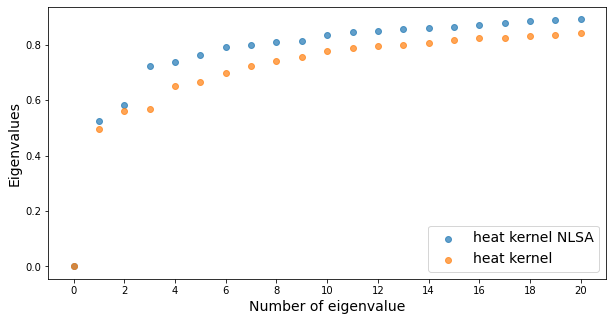

In [436]:
plot_eigenvalues(w_mean, w_simple, w_mean_nlsa, w_simple_nlsa, NUM_EIGENVALUES)

### Clustering:

In [437]:
%%time
from sklearn.cluster import SpectralClustering

# Cluster on january-february only:
jan_feb = pd.DataFrame()

y = years[1]
range_ = pd.date_range(f'{y}-01-01', f'{y}-03-01', freq='6H')
jan_feb = eigv_time_mean_nlsa.loc[range_]

for y in years[2:]:
    range_ = pd.date_range(f'{y}-01-01', f'{y}-03-01', freq='6H')
    jan_feb = pd.concat([jan_feb, eigv_time_mean_nlsa.loc[range_]], axis=0)

# take first five eigenvectors
df_ = jan_feb[[1, 2, 3, 4, 5]]
df = np.real(df_.values)
spectral = SpectralClustering(n_clusters=2, random_state=0,
                              affinity='rbf').fit(df)

jan_feb['cluster_label_spectral_kernel'] = spectral.labels_

CPU times: user 39.6 s, sys: 16.8 s, total: 56.4 s
Wall time: 11 s


In [438]:
"""
from sklearn.cluster import KMeans

df = np.real(eigv_time_mean_nlsa.values)
kmeans = KMeans(n_clusters=3, random_state=0).fit(df)

eigv_time_mean_nlsa['cluster_label'] = kmeans.labels_"""

"\nfrom sklearn.cluster import KMeans\n\ndf = np.real(eigv_time_mean_nlsa.values)\nkmeans = KMeans(n_clusters=3, random_state=0).fit(df)\n\neigv_time_mean_nlsa['cluster_label'] = kmeans.labels_"

In [439]:
%%time
from sklearn.cluster import SpectralClustering

df = np.real(eigv_time_mean_nlsa.values)
spectral = SpectralClustering(n_clusters=2, random_state=0,
                              affinity='rbf').fit(df)

eigv_time_mean_nlsa['cluster_label_spectral_kernel'] = spectral.labels_

CPU times: user 4min 18s, sys: 1min 9s, total: 5min 27s
Wall time: 1min 34s


In [440]:
eigv_time_mean_nlsa

,1,2,3,4,5,6,7,8,9,10,...,12,13,14,15,16,17,18,19,20,cluster_label_spectral_kernel
Date,,,,,,,,,,,,,,,,,,,,,
1979-11-30 06:00:00,0.000102+0.000000j,-0.000052+0.000000j,-0.000098+0.000000j,0.000027+0.000000j,0.000028+0.000000j,-8.676624e-06+0.000000e+00j,0.000025+0.000000j,0.000023+0.000000j,-0.000021+0.000000j,0.000026+0.000000j,...,0.000037+0.000000j,-0.000020+0.000000j,1.085492e-05+0.000000e+00j,-0.000017+0.000000j,0.000128+0.000000j,0.000053+0.000000j,3.419780e-05+0.000000e+00j,0.000012+0.000000j,-0.000051+0.000000j,0
1979-11-30 12:00:00,0.000107+0.000000j,-0.000053+0.000000j,-0.000103+0.000000j,0.000028+0.000000j,0.000024+0.000000j,-8.411389e-06+0.000000e+00j,0.000031+0.000000j,0.000019+0.000000j,-0.000022+0.000000j,0.000025+0.000000j,...,0.000042+0.000000j,-0.000020+0.000000j,1.686649e-05+0.000000e+00j,-0.000019+0.000000j,0.000134+0.000000j,0.000048+0.000000j,2.837982e-05+0.000000e+00j,0.000013+0.000000j,-0.000055+0.000000j,0
1979-11-30 18:00:00,0.000111+0.000000j,-0.000054+0.000000j,-0.000109+0.000000j,0.000030+0.000000j,0.000017+0.000000j,-1.004488e-05+0.000000e+00j,0.000036+0.000000j,0.000017+0.000000j,-0.000024+0.000000j,0.000025+0.000000j,...,0.000047+0.000000j,-0.000019+0.000000j,2.435280e-05+0.000000e+00j,-0.000023+0.000000j,0.000138+0.000000j,0.000039+0.000000j,1.999909e-05+0.000000e+00j,0.000016+0.000000j,-0.000061+0.000000j,0
1979-12-01 00:00:00,0.000116+0.000000j,-0.000054+0.000000j,-0.000117+0.000000j,0.000030+0.000000j,0.000011+0.000000j,-8.819863e-06+0.000000e+00j,0.000046+0.000000j,0.000016+0.000000j,-0.000022+0.000000j,0.000024+0.000000j,...,0.000048+0.000000j,-0.000014+0.000000j,2.788463e-05+0.000000e+00j,-0.000027+0.000000j,0.000143+0.000000j,0.000030+0.000000j,1.042743e-05+0.000000e+00j,0.000016+0.000000j,-0.000066+0.000000j,0
1979-12-01 06:00:00,0.000121+0.000000j,-0.000052+0.000000j,-0.000123+0.000000j,0.000032+0.000000j,0.000005+0.000000j,-8.182518e-06+0.000000e+00j,0.000053+0.000000j,0.000014+0.000000j,-0.000024+0.000000j,0.000028+0.000000j,...,0.000049+0.000000j,-0.000013+0.000000j,2.961357e-05+0.000000e+00j,-0.000026+0.000000j,0.000142+0.000000j,0.000023+0.000000j,-5.567758e-08+0.000000e+00j,0.000016+0.000000j,-0.000071+0.000000j,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-04-29 18:00:00,-0.000021+0.000000j,0.000044+0.000000j,-0.000034+0.000000j,-0.000007+0.000000j,0.000002+0.000000j,1.494207e-06+0.000000e+00j,0.000030+0.000000j,-0.000032+0.000000j,-0.000055+0.000000j,0.000026+0.000000j,...,0.000014+0.000000j,-0.000046+0.000000j,1.055981e-06+0.000000e+00j,0.000014+0.000000j,-0.000044+0.000000j,-0.000036+0.000000j,2.859285e-05+0.000000e+00j,0.000024+0.000000j,0.000018+0.000000j,0
2018-04-30 00:00:00,-0.000021+0.000000j,0.000042+0.000000j,-0.000033+0.000000j,-0.000008+0.000000j,0.000002+0.000000j,2.877397e-07+0.000000e+00j,0.000029+0.000000j,-0.000031+0.000000j,-0.000053+0.000000j,0.000024+0.000000j,...,0.000013+0.000000j,-0.000044+0.000000j,1.039033e-06+0.000000e+00j,0.000014+0.000000j,-0.000044+0.000000j,-0.000037+0.000000j,2.677772e-05+0.000000e+00j,0.000026+0.000000j,0.000018+0.000000j,0
2018-04-30 06:00:00,-0.000021+0.000000j,0.000040+0.000000j,-0.000032+0.000000j,-0.000009+0.000000j,0.000003+0.000000j,-1.022568e-06+0.000000e+00j,0.000027+0.000000j,-0.000030+0.000000j,-0.000051+0.000000j,0.000021+0.000000j,...,0.000012+0.000000j,-0.000042+0.000000j,2.100499e-07+0.000000e+00j,0.000015+0.000000j,-0.000043+0.000000j,-0.000036+0.000000j,2.466395e-05+0.000000e+00j,0.000029+0.000000j,0.000018+0.000000j,0


### Plot all eigenvectors for all years:

In [441]:
def plot_all_eig_clusters(eigv_time, jan_feb, clusters = False, traj = traj_2months):
    fig, axs = plt.subplots(10, 1, figsize=(20, 25))
    m = 1
    for i in range(10):
        
        full_winters = pd.date_range('1980-01-01', '2017-12-31', freq = '6H')
        df = pd.DataFrame(index=full_winters,
                          data={
                              m:
                              eigv_time_mean_nlsa[m],
                              'cluster_label_spectral_kernel':
                              eigv_time_mean_nlsa['cluster_label_spectral_kernel']
                          })        
        axs[i].plot(df[m], alpha=0.5, color = 'grey')
        colors = {0: 'blue', 1: 'red', 2: 'green'}
        
        if i%2 == 0:
            # All clusters:
            draw_clusters = df.dropna()
            labels = jan_feb['cluster_label_spectral_kernel']
            axs[i].scatter(jan_feb[m].index,
                                       jan_feb[m].values,marker=".",s = 6,
                                       c=labels.apply(lambda x: colors[x]))
        
            axs[i].set_ylabel(f"eigenvector {m}")
            xticks = pd.date_range('1979', '2021', freq='1Y')
            xticks_ = [i.year+1 for i in xticks]
            axs[i].set_xticks(xticks)
            axs[i].set_xticklabels(xticks_)
            axs[i].set_xlim([pd.to_datetime('1979'), pd.to_datetime('2019')])
        
        # Clusters for traj:
        else:
            for year in traj:
                for el in traj[str(year)]:
                    if el[0].month[0] < 4:
                        if el[0].month[-1] < 3:
                            range_ = el[0]
                        else: 
                            y = el[0][0].year
                            month = el[0][0].month
                            d = el[0][0].day
                            range_ = pd.date_range(f'{y}-{month}-{d}', f'{y}-03-01', freq = '6H')
                        trajectory = jan_feb[m][range_]
                        type_ = el[1]
                        labels = jan_feb.loc[trajectory.index]['cluster_label_spectral_kernel']
                        axs[i].scatter(trajectory.index,
                                           trajectory.values,marker=".", s = 6,
                                           c=labels.apply(lambda x: colors[x]))

            axs[i].set_ylabel(f"eigenvector {m}")
            xticks = pd.date_range('1979', '2021', freq='1Y')
            xticks_ = [i.year+1 for i in xticks]
            axs[i].set_xticks(xticks)
            axs[i].set_xticklabels(xticks_)
            axs[i].set_xlim([pd.to_datetime('1979'), pd.to_datetime('2019')])
            m += 1

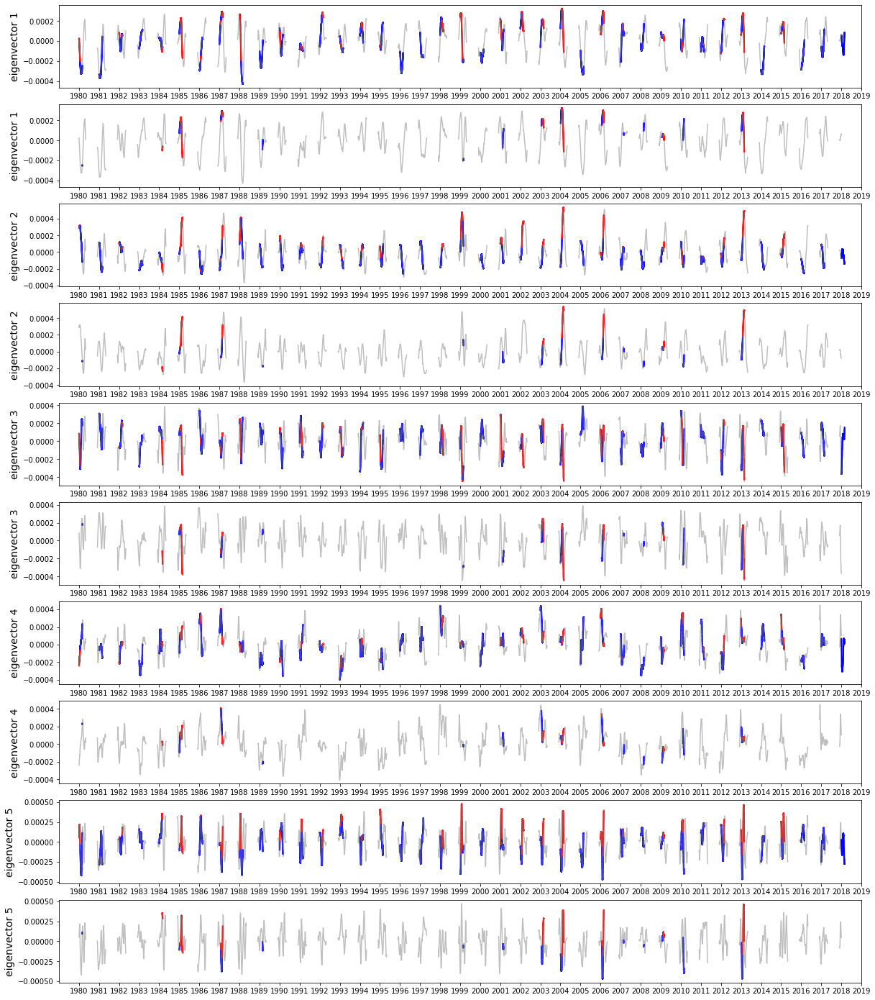

In [442]:
colors_lines ={'S':'darkblue', 'D':'darkred', 'D+S':'darkorange', 'N':'green'}

plot_all_eig_clusters(eigv_time_mean_nlsa,jan_feb, traj = traj_2months)

In [443]:
def plot_all_eig(eigv_time, colors_lines, traj = traj_2months):
    fig, axs = plt.subplots(10, 1, figsize=(30, 35))
    m = 1
    for i in range(10):
        
        
        full_winers = pd.date_range('1980-01-01', '2017-12-31', freq = '6H')
        df = pd.DataFrame(index=full_winers,
                          data={
                              m:
                              eigv_time_mean_nlsa[m],
                          })        
        axs[i].plot(df[m], alpha=0.5, color = 'grey')
        colors = ['blue', 'red','green']
        
        for year in traj:
            for el in traj[str(year)]:
                trajectory = eigv_time[m][el[0]]
                type_ = el[1]
                #labels = eigv_time.loc[trajectory.index]['cluster_label_spectral_kernel']

                axs[i].plot(trajectory.index,trajectory.values,
                                    alpha=1,color = colors_lines[type_],
                                    linewidth=0.8)
        axs[i].set_ylabel(f"eigenvector {m}")
        xticks = pd.date_range('1979', '2021', freq='1Y')
        xticks_ = [i.year+1 for i in xticks]
        axs[i].set_xticks(xticks)
        axs[i].set_xticklabels(xticks_)
        axs[i].set_xlim([pd.to_datetime('1979'), pd.to_datetime('2019')])
        m += 1

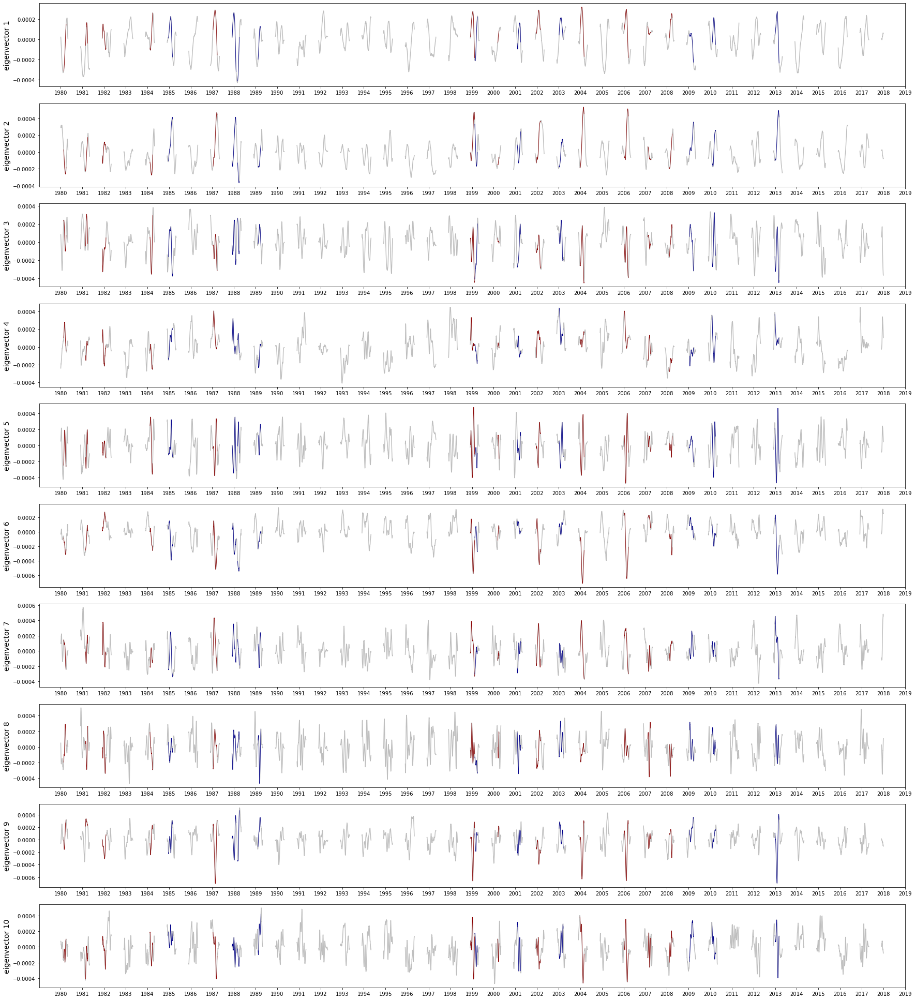

In [444]:
plot_all_eig(eigv_time_mean_nlsa, colors_lines, traj = traj_30_10)

### Average trajectories with and without SSW:

In [445]:
def Diff(li1, li2):
    return (list(list(set(li1) - set(li2)) + list(set(li2) - set(li1))))

winters_S, winters_D, winters_ssw = [], [], []
for d in dates:
    year = pd.to_datetime(d[0]).year
    month = pd.to_datetime(d[0]).month
    type_ = d[1]
    if month < 10 and year not in winters_ssw:
        winters_ssw.append(year - 1)
        if type_ == 'S':
            winters_S.append(year - 1)
        else:
            winters_D.append(year - 1)
    if month >= 10 and year not in winters_ssw:
        winters_ssw.append(year)
        if type_ == 'S':
            winters_S.append(year)
        else:
            winters_D.append(year)
            
winters_ssw = np.unique(np.array(winters_ssw))
winters_S = np.unique(np.array(winters_S))
winters_D = np.unique(np.array(winters_D))

winters_no_ssw = np.sort(Diff(range(1979, 2017, 1), winters_ssw))
print('Winters with SSW:')
print(winters_ssw)
print('Winters with SSW type split:')
print(winters_S)
print('Winters with SSW type displacement:')
print(winters_D)
print('Winters without SSW:')
print(winters_no_ssw)

Winters with SSW:
[1979 1980 1981 1983 1984 1986 1987 1988 1998 1999 2000 2001 2002 2003
 2005 2006 2007 2008 2009 2012]
Winters with SSW type split:
[1984 1987 1988 1998 2000 2002 2008 2009 2012]
Winters with SSW type displacement:
[1979 1980 1981 1983 1986 1998 1999 2001 2003 2005 2006 2007]
Winters without SSW:
[1982 1985 1989 1990 1991 1992 1993 1994 1995 1996 1997 2004 2010 2011
 2013 2014 2015 2016]


In [446]:
def average_traj(eig, winters_years):
    # first winter:
    year = winters_years[0]
    winter_of_that_year = pd.date_range(str(year) + '-12',
                                        str(year + 1) + '-04',
                                        freq='6H')
    winter_eig = eig[winter_of_that_year][:485]

    df = pd.DataFrame(index=transform_date(winter_eig.index)[:485],
                      data={year: winter_eig.values})
    for year in winters_years[1:]:
        winter_of_that_year = pd.date_range(str(year) + '-12',
                                            str(year + 1) + '-04',
                                            freq='6H')
        val = eig[winter_of_that_year][:485].values

        df[year] = eig[winter_of_that_year][:485].values

    return np.mean(df, axis=1), df

In [447]:
def traj_SSW_spring(type_ = 'S', winters_S = winters_S):
    trajectories = []
    for winter in winters_S:
        if str(winter) in traj_30_10:
            for traj in traj_30_10[str(winter)]:
                month_1 = traj[0].month[0]
                # if trajectory of ssw starts before march 
                if month_1 <= 3 and traj[1] in type_:
                    trajectories.append(traj)
    return trajectories

traj_S_spring = traj_SSW_spring(type_ = 'S', winters_S = winters_S)
traj_D_spring = traj_SSW_spring(type_ = 'D', winters_S = winters_D)
traj_ssw_spring = traj_SSW_spring(type_ = ['D','S'], winters_S = winters_ssw)

traj_no_ssw_spring = []
for winter in winters_no_ssw:
    traj_no_ssw_spring.append([
        pd.date_range(str(winter) + '-01', str(winter) + '-04', freq='6H'), 'N'
    ])

In [448]:
def traj_SSW_winter(type_ = 'S', winters_S = winters_S):
    trajectories = []
    for winter in winters_S:
        if str(winter) in traj_30_10:
            for traj in traj_30_10[str(winter)]:
                month_1 = traj[0].month[0]
                # if trajectory of ssw starts before march 
                if month_1 > 4 and traj[1] in type_:
                    trajectories.append(traj)
    return trajectories

traj_S_winter = traj_SSW_winter(type_ = 'S', winters_S = winters_S)
traj_D_winter = traj_SSW_winter(type_ = 'D', winters_S = winters_D)
traj_ssw_winter = traj_SSW_winter(type_ = ['D','S'], winters_S = winters_ssw)

traj_no_ssw_winter = []
for winter in winters_no_ssw:
    traj_no_ssw_winter.append([
        pd.date_range(str(winter) + '-12-01', str(winter) + '-12-31', freq='6H'), 'N'
    ])

In [449]:
def avg_traj_spring(eig, trajectories):
    m = 1
    winter_eig = eig[trajectories[0][0]]
    ind = transform_date(winter_eig.index, special_traj = True)
    test = pd.Series(index = ind, data = winter_eig.values)
    if pd.datetime(1984,2,28) in test.index:
        test.drop(test['1984-02-28'].index, axis = 0, inplace = True)
    df = pd.DataFrame(index = pd.date_range(str(1984) + '-01', str(1984) + '-04',
                                                freq='6H'), data = {1: test})
    n = 2
    for traj in trajectories[1:]: 
        winter_eig = eig[traj[0]]

        ind = transform_date(winter_eig.index, special_traj = True)
        test = pd.Series(index = ind, data = winter_eig.values)
        if pd.datetime(1984,2,28) in test.index:
            test.drop(test['1984-02-28'].index, axis = 0, inplace = True)
        df[n] = test
        n+= 1
    
    return np.mean(df, axis=1), df

In [450]:
def avg_traj_winter(eig, trajectories):
    m = 1
    winter_eig = eig[trajectories[0][0]]
    ind = transform_date(winter_eig.index, special_traj = True)
    test = pd.Series(index = ind, data = winter_eig.values)

    df = pd.DataFrame(index = pd.date_range(str(1983) + '-12-01', str(1983) + '-12-31',
                                                freq='6H'), data = {1: test})
    n = 2
    for traj in trajectories[1:]: 
        winter_eig = eig[traj[0]]

        ind = transform_date(winter_eig.index, special_traj = True)
        test = pd.Series(index = ind, data = winter_eig.values)
        df[n] = test
        n+= 1
    
    return np.mean(df, axis=1), df

In [451]:
def transform_date(column, special_traj=False):
    
    if special_traj:
        new_col = []
        month = column[0].month
        for i in column:
            month = i.month
            day = i.day
            if month < 4:
                if month == 2 and day == 29:
                    new_col.append(
                        datetime(1984, month, day - 1, i.hour, i.minute,
                                 i.second))
                else:
                    new_col.append(
                        datetime(1984, month, day, i.hour, i.minute, i.second))
            else:
                new_col.append(
                    datetime(1983, month, day, i.hour, i.minute, i.second))
    else:
        new_col = []
        year = column[0].year
        for i in column:
            month = i.month
            day = i.day
            if i.year > year:
                if month == 2 and day == 29:
                    new_col.append(
                        datetime(1984, month, day - 1, i.hour, i.minute,
                                 i.second))
                else:
                    new_col.append(
                        datetime(1984, month, day, i.hour, i.minute, i.second))
            else:
                new_col.append(
                    datetime(1983, month, day, i.hour, i.minute, i.second))
    return new_col

### Histograms according to clusters:

In [452]:
def select_years(df, winters):
    winters_ = [str(i) for i in winters]
    df_ = df[winters_[0]]
    for y in winters_[1:]:
        df_ = pd.concat([df_, df[y]], axis=1)
    return df_

df_ssw = select_years(eigv_time_mean_nlsa, winters_ssw)
df_no_ssw = select_years(eigv_time_mean_nlsa, winters_no_ssw)
df_ssw_D = select_years(eigv_time_mean_nlsa, winters_D)
df_ssw_S = select_years(eigv_time_mean_nlsa, winters_S)

In [453]:
def select_years_winters(df, winters):
    winters_ = [str(i) for i in winters]
    df_ = df[winters_[0] + '-12']
    for y in winters_[1:]:
        df_ = pd.concat([df_, df[y + '-12']], axis=1)
    return df_


def select_years_spring(df, winters):
    if 1979 in winters:
        winters_ = [str(i + 1) for i in winters[1:]]
    else:
        winters_ = [str(i + 1) for i in winters]
    spring = pd.date_range(winters_[0] + '-01', winters_[0] + '-03', freq='6H')
    df_ = df.loc[spring]
    for y in winters_[1:]:
        spring = pd.date_range(y + '-01', y + '-03', freq='6H')
        df_ = pd.concat([df_, df.loc[spring]], axis=1)
    return df_


df_ssw_winters = select_years_winters(eigv_time_mean_nlsa, winters_ssw)
df_ssw_spring = select_years_spring(eigv_time_mean_nlsa, winters_ssw)

df_no_ssw_winters = select_years_winters(eigv_time_mean_nlsa, winters_no_ssw)
df_no_ssw_spring = select_years_spring(eigv_time_mean_nlsa, winters_no_ssw)

df_ssw_D_winters = select_years_winters(eigv_time_mean_nlsa, winters_D)
df_ssw_D_spring = select_years_spring(eigv_time_mean_nlsa, winters_D)

df_ssw_S_winters = select_years_winters(eigv_time_mean_nlsa, winters_S)
df_ssw_S_spring = select_years_spring(eigv_time_mean_nlsa, winters_S)

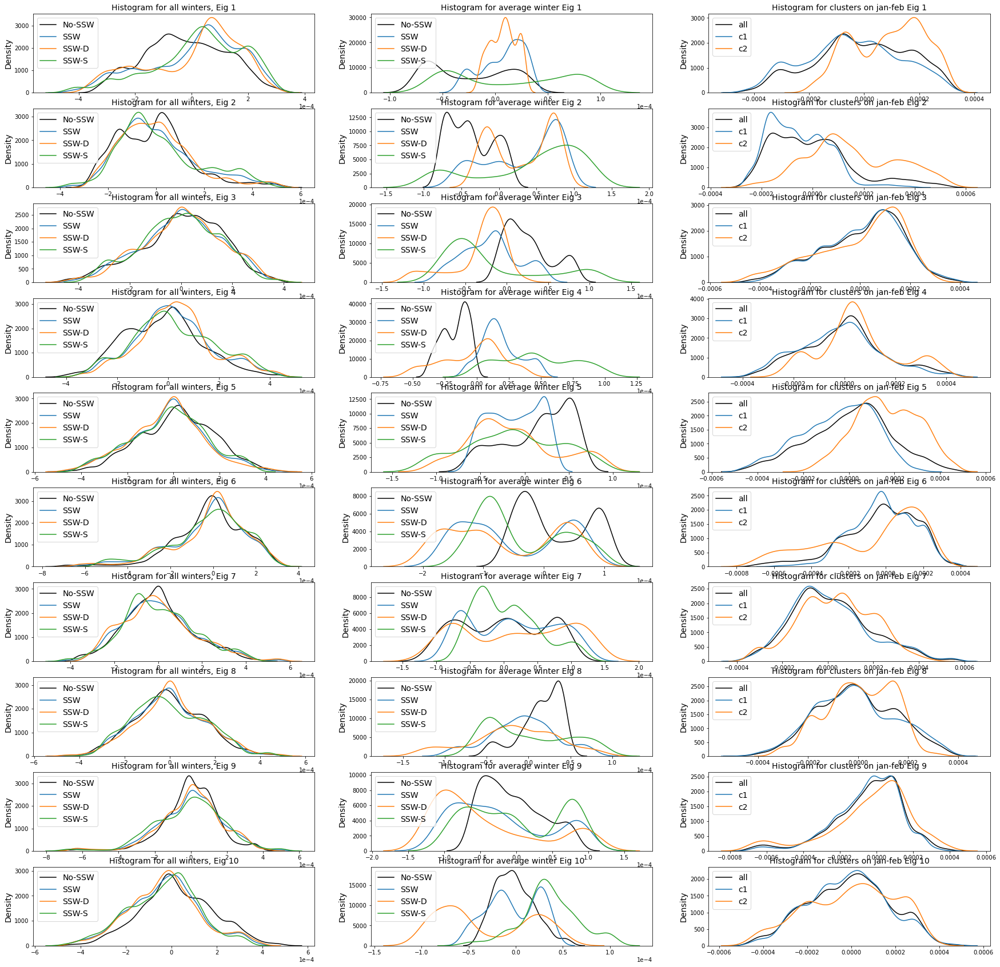

In [454]:
fig, ax = plt.subplots(10, 3, figsize=(30, 30))

m = 1
n = 0
for j in range(10):
    for n in range(3):
        avg_no_ssw, df = average_traj(eigv_time_mean_nlsa[m], winters_no_ssw)
        avg_ssw, df = average_traj(eigv_time_mean_nlsa[m], winters_ssw)
        avg_ssw_D, df = average_traj(eigv_time_mean_nlsa[m], winters_D)
        avg_ssw_S, df = average_traj(eigv_time_mean_nlsa[m], winters_S)
        if n == 0:
            sns.distplot(df_no_ssw[m].values,
                         ax=ax[j, n],
                         label='No-SSW',
                         kde=True,
                         hist=False,color='black')
            sns.distplot(df_ssw[m].values,
                         ax=ax[j, n],
                         label='SSW',
                         kde=True,
                         hist=False)
            sns.distplot(df_ssw_D[m].values,
                         ax=ax[j, n],
                         label='SSW-D',
                         kde=True,
                         hist=False)
            sns.distplot(df_ssw_S[m].values,
                         ax=ax[j, n],
                         label='SSW-S',
                         kde=True,
                         hist=False)
            ax[j, n].set_title(f'Histogram for all winters, Eig {m}')
            ax[j, n].ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
            ax[j, n].legend(loc='upper left')
        
        # Plot clusters for january-february period:
        if n == 2:
            c1 = jan_feb[jan_feb['cluster_label_spectral_kernel'] == 0]
            c2 = jan_feb[jan_feb['cluster_label_spectral_kernel'] == 1]
            c3 = jan_feb[jan_feb['cluster_label_spectral_kernel'] == 2]
            sns.distplot(jan_feb[m].values,
                         ax=ax[j, n],
                         label='all',
                         color='black',
                         kde=True,
                         hist=False)
            sns.distplot(c1[m].values,
                         ax=ax[j, n],
                         label='c1',
                         kde=True,
                         hist=False)
            sns.distplot(c2[m].values,
                         ax=ax[j, n],
                         label='c2',
                         kde=True,
                         hist=False)
            sns.distplot(c3[m].values,
                         ax=ax[j, n],
                         label='c3',
                         kde=True,
                         hist=False)
            ax[j, n].set_title(f'Histogram for clusters on jan-feb Eig {m}')
            ax[j, n].legend(loc='upper left')
            m += 1
        
        if n == 1:
            sns.distplot(avg_no_ssw.values,
                         ax=ax[j, n],
                         label='No-SSW',
                         kde=True,
                         hist=False,color='black')
            sns.distplot(avg_ssw.values,
                         ax=ax[j, n],
                         label='SSW',
                         kde=True,
                         hist=False)
            sns.distplot(avg_ssw_D.values,
                         ax=ax[j, n],
                         label='SSW-D',
                         kde=True,
                         hist=False)
            sns.distplot(avg_ssw_S.values,
                         ax=ax[j, n],
                         label='SSW-S',
                         kde=True,
                         hist=False)
            ax[j, n].set_title(f'Eigenvector {m}')
            ax[j, n].ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
            ax[j, n].set_title(f'Histogram for average winter Eig {m}')
            ax[j, n].legend(loc='upper left')

### One winter NLSA:

In [455]:
def plot_one_winter_nlsa(eigv_time, eigv_time_simple, sign_mean, sign_simple,
                         year):
    fig, axs = plt.subplots(4, 5, figsize=(23, 20))
    m = 1
    for i in range(4):
        for j in range(5):
            winter_2008 = pd.date_range(str(year) + '-12',
                                        str(year + 1) + '-04',
                                        freq='6H')
            winter_2008_eig_mean = eigv_time[m][winter_2008]
            winter_2008_eig_simple = eigv_time_simple[m][winter_2008]

            axs[i, j].plot(winter_2008_eig_mean.index,
                           sign_mean[m] * winter_2008_eig_mean.values,
                           label='heat kernel')
            axs[i, j].plot(winter_2008_eig_simple.index,
                           sign_simple[m] * winter_2008_eig_simple.values,
                           label='simple')
            axs[i, j].set_title(f"Eigenvector {m}")
            axs[i, j].set_xticks((str(year) + '-12', str(year + 1) + '-01',
                                  str(year + 1) + '-02', str(year + 1) + '-03',
                                  str(year + 1) + '-04'))
            axs[i, j].set_xticklabels(['Dec', 'Jan', 'Feb', 'Mar', 'Apr'])
            m += 1
    plt.legend()

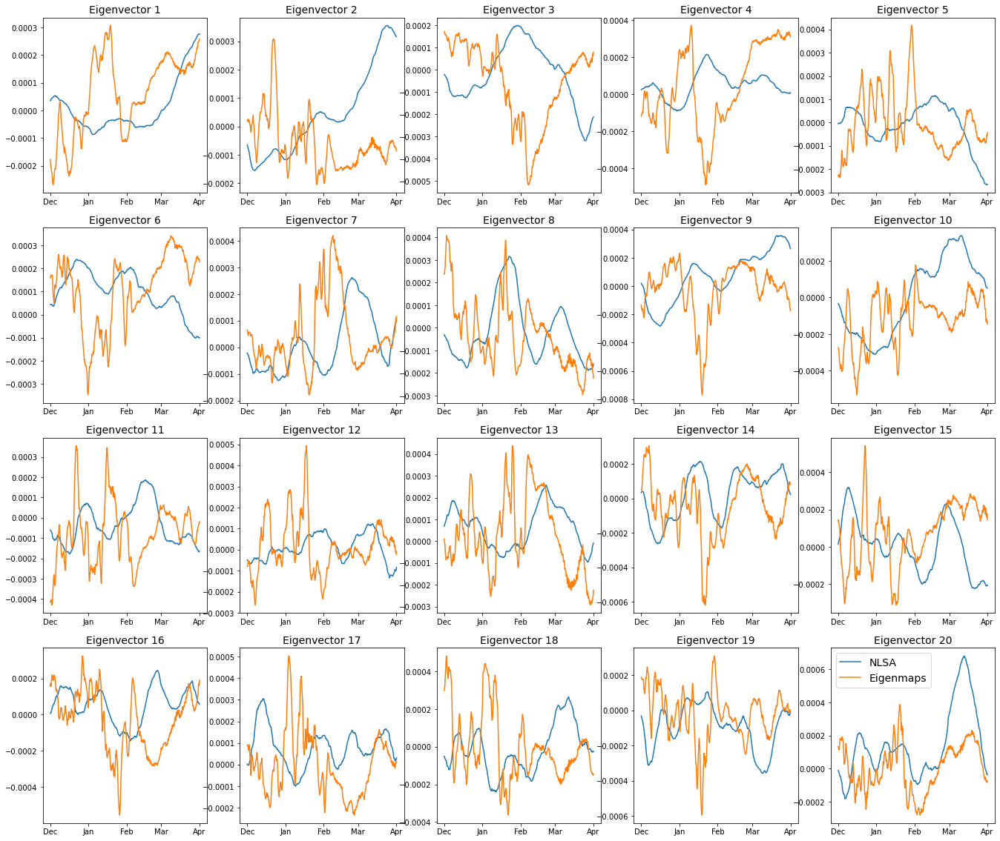

In [456]:
# NLSA versus Laplacian Eigenmaps: 
sign_mean = [0, 1, -1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, -1, 1, 1, 1, 1, 1, 1]
sign_mean_nlsa = [0, -1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, -1, 1, 1, 1, 1, 1, 1]
plot_one_winter_nlsa(eigv_time_mean_nlsa, eigv_time_mean,
                     sign_mean_nlsa, sign_mean, 2008)
plt.legend(['NLSA', 'Eigenmaps'])

### Individual winters: 

Plot each winter for an eigenvector

In [457]:
def plot_each_winter_nlsa(eigv_time,
                          eigv_time_simple,
                          sign_mean,
                          sign_simple,
                          years,
                          num_eig=1, colors_points = colors_points):
    fig, axs = plt.subplots(10, 4, figsize=(30, 35))
    m = 0
    min_ = np.min(eigv_time[num_eig])
    max_ = np.max(eigv_time[num_eig])
    for i in range(10):
        for j in range(4):
            if m == 39:
                break
            # get winter dates:
            winter = pd.date_range(years[m] + '-12',
                                   years[m + 1] + '-04',
                                   freq='6H')
            # select time series for that winter:
            winter_eig_mean = eigv_time[num_eig][winter]
            winter_eig_simple = eigv_time_simple[num_eig][winter]

            axs[i, j].plot(winter_eig_mean.index,
                           sign_mean * winter_eig_mean.values)
            axs[i, j].plot(winter_eig_simple.index,
                           sign_simple * winter_eig_simple.values)

            # add end of year dates (Dec):
            if years[m] in years_in_d:
                for el in years_in_d[years[m]]:
                    d_ = el[0]
                    if pd.to_datetime(d_).month > 10:
                        axs[i, j].plot(pd.to_datetime(d_),
                                       sign_mean * winter_eig_mean[d_],
                                       'X',
                                       color=colors_points[el[1]])
                        axs[i, j].annotate(d_[:-9],
                                           (pd.to_datetime(d_),
                                            sign_mean * winter_eig_mean[d_]))
            # add beginning of next year dates (Jan-Apr):
            if years[m + 1] in years_in_d:
                for el in years_in_d[years[m + 1]]:
                    d_ = el[0]
                    if pd.to_datetime(d_).month < 4:
                        axs[i, j].plot(pd.to_datetime(d_),
                                       sign_mean * winter_eig_mean[d_],
                                       'X',
                                       color=colors_points[el[1]])
                        axs[i, j].annotate(d_[:-9],
                                           (pd.to_datetime(d_),
                                            sign_mean * winter_eig_mean[d_]))

            axs[i, j].set_title("Winter " + years[m] + '-' + years[m + 1])
            axs[i, j].set_xticks(
                (years[m] + '-12', years[m + 1] + '-01', years[m + 1] + '-02',
                 years[m + 1] + '-03', years[m + 1] + '-04'))
            axs[i, j].set_xticklabels(['Dec', 'Jan', 'Feb', 'Mar', 'Apr'])

            if sign_mean > 0:
                axs[i, j].set_ylim([min_, max_])
            else:
                axs[i, j].set_ylim([-max_, -min_])
            m += 1

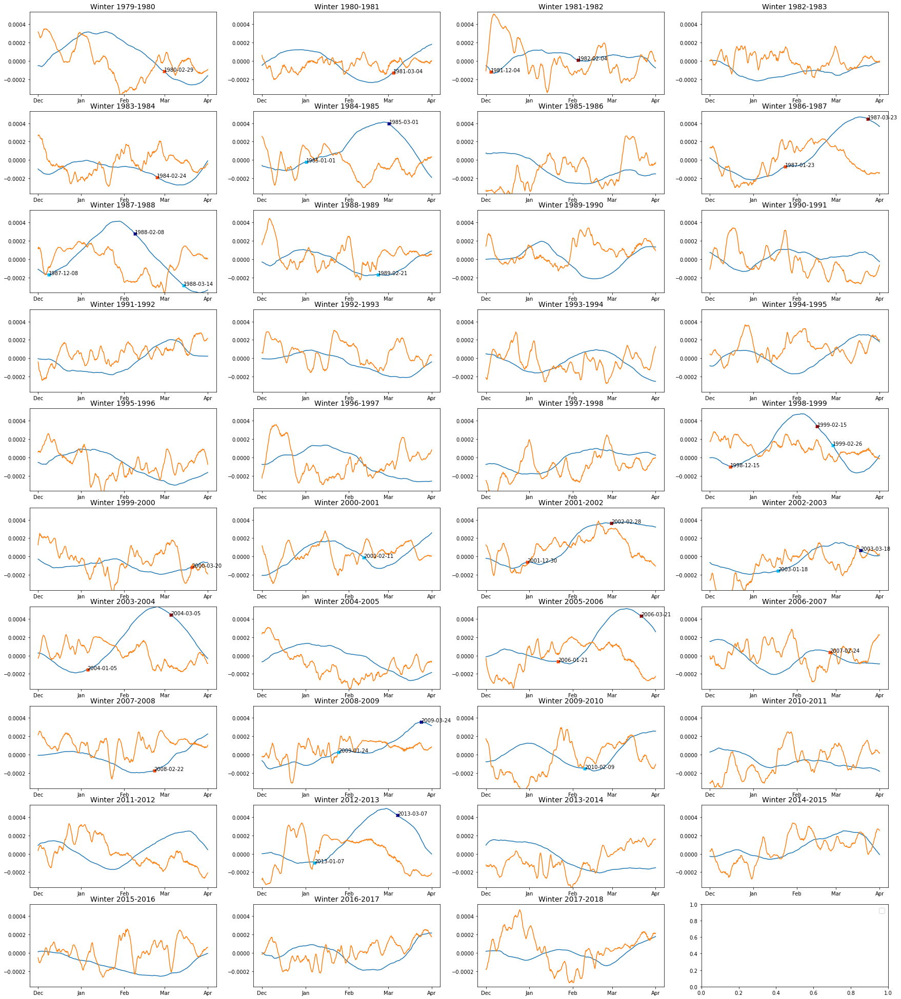

In [458]:
plot_each_winter_nlsa(eigv_time_mean_nlsa, eigv_time_mean, 1,
                      1, years, num_eig = 2)
plt.legend(['NLSA', 'Eigenmaps'])
#plt.suptitle('NLSA winters for first eigenvector')

### Histograms:

In [459]:
def select_years_winters(df, winters):
    winters_ = [str(i) for i in winters]
    df_ = df[winters_[0] + '-12']
    for y in winters_[1:]:
        df_ = pd.concat([df_, df[y + '-12']], axis=1)
    return df_


def select_years_spring(df, winters, start = '01', end = '04'):
    if 1979 in winters:
        winters_ = [str(i + 1) for i in winters[1:]]
    else:
        winters_ = [str(i + 1) for i in winters]
    spring = pd.date_range(winters_[0] + f'-{start}', winters_[0] + f'-{end}', freq='6H')
    df_ = df.loc[spring]
    for y in winters_[1:]:
        spring = pd.date_range(y + f'-{start}', y + f'-{end}', freq='6H')
        df_ = pd.concat([df_, df.loc[spring]], axis=1)
    return df_


df_ssw_winters = select_years_winters(eigv_time_mean_nlsa, winters_ssw)
df_ssw_janfeb = select_years_spring(eigv_time_mean_nlsa, winters_ssw,'01','03')
df_ssw_march = select_years_spring(eigv_time_mean_nlsa, winters_ssw,'02','04')

df_no_ssw_winters = select_years_winters(eigv_time_mean_nlsa, winters_no_ssw)
df_no_ssw_janfeb = select_years_spring(eigv_time_mean_nlsa, winters_no_ssw,'01','03')
df_no_ssw_march = select_years_spring(eigv_time_mean_nlsa, winters_no_ssw,'02','04')

"""
df_ssw_D_winters = select_years_winters(eigv_time_mean_nlsa, winters_D)
df_ssw_D_spring = select_years_spring(eigv_time_mean_nlsa, winters_D)

df_ssw_S_winters = select_years_winters(eigv_time_mean_nlsa, winters_S)
df_ssw_S_spring = select_years_spring(eigv_time_mean_nlsa, winters_S)"""

'\ndf_ssw_D_winters = select_years_winters(eigv_time_mean_nlsa, winters_D)\ndf_ssw_D_spring = select_years_spring(eigv_time_mean_nlsa, winters_D)\n\ndf_ssw_S_winters = select_years_winters(eigv_time_mean_nlsa, winters_S)\ndf_ssw_S_spring = select_years_spring(eigv_time_mean_nlsa, winters_S)'

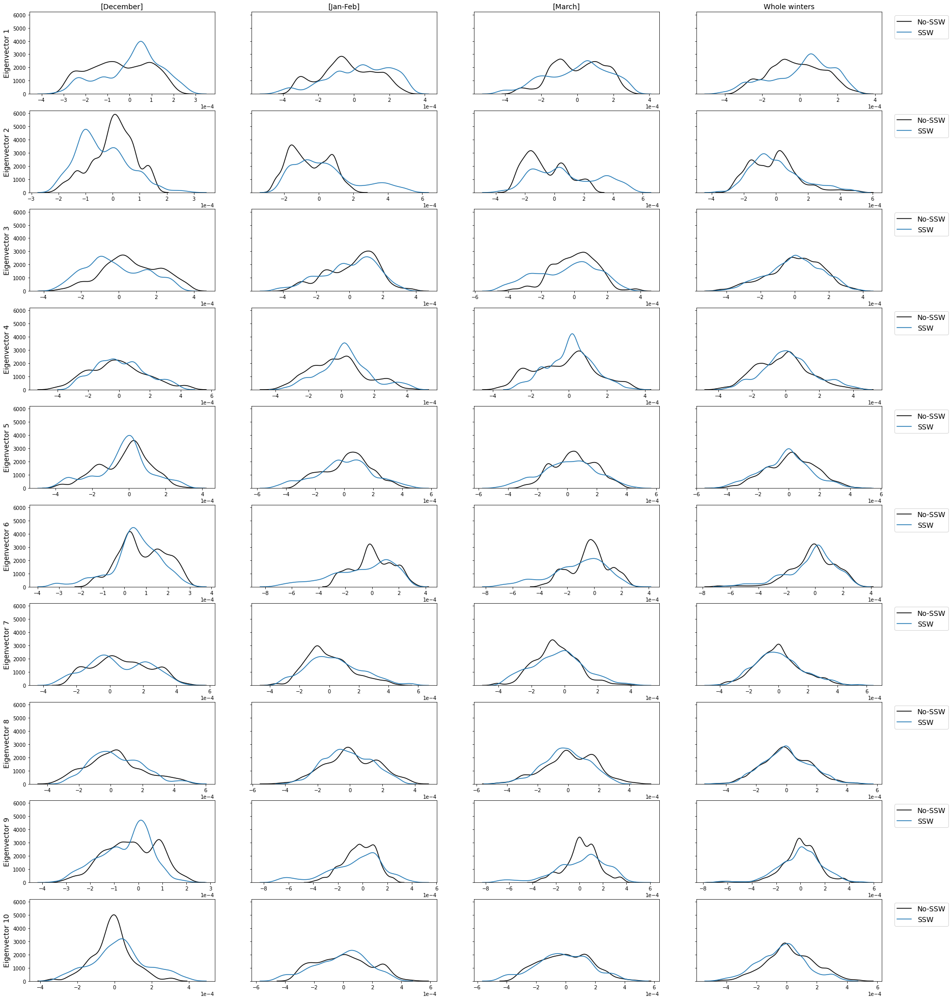

In [460]:
fig, ax = plt.subplots(10, 4, figsize=(30, 35),sharex=False, sharey=True)

m = 1
n = 0
for j in range(10):
    for n in range(4):
        eig = eigv_time_mean_nlsa[m]

        if n == 0:
            sns.distplot(df_no_ssw_winters[m].values,
                         ax=ax[j, n],
                         label='No-SSW',
                         kde=True,hist = False,color='black')
            sns.distplot(df_ssw_winters[m].values,
                         ax=ax[j, n],
                         label='SSW',
                         kde=True, hist = False)
            """
            sns.distplot(df_ssw_D_winters[m].values,
                         ax=ax[j, n],
                         label='SSW-D',
                         kde=True, hist = False)
            sns.distplot(df_ssw_S_winters[m].values,
                         ax=ax[j, n],
                         label='SSW-S',
                         kde=True, hist = False)"""
            if j == 0:
                ax[j, n].set_title(f'[December]')
            ax[j, n].set_ylabel(f'Eigenvector {m}')
            ax[j, n].ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
        if n == 1:
            sns.distplot(df_no_ssw_janfeb[m].values,
                         ax=ax[j, n],
                         label='No-SSW',
                         kde=True,hist = False,color='black')
            sns.distplot(df_ssw_janfeb[m].values,
                         ax=ax[j, n],
                         label='SSW',
                         kde=True, hist = False)
            """
            sns.distplot(df_ssw_D_spring[m].values,
                         ax=ax[j, n],
                         label='SSW-D',
                         kde=True, hist = False)
            sns.distplot(df_ssw_S_spring[m].values,
                         ax=ax[j, n],
                         label='SSW-S',
                         kde=True, hist = False)"""
            if j == 0:
                ax[j, n].set_title(f'[Jan-Feb]')
            ax[j, n].set_ylabel('')
            ax[j, n].ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
        if n == 2:
            sns.distplot(df_no_ssw_march[m].values,
                         ax=ax[j, n],
                         label='No-SSW',
                         kde=True,hist = False,color='black')
            sns.distplot(df_ssw_march[m].values,
                         ax=ax[j, n],
                         label='SSW',
                         kde=True, hist = False)
            if j == 0:
                ax[j, n].set_title(f'[March]')
            ax[j, n].set_ylabel('')
            ax[j, n].ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
            
        if n == 3:
            sns.distplot(df_no_ssw[m].values,
                         ax=ax[j, n],
                         label='No-SSW',
                         kde=True,hist = False,color='black')
            sns.distplot(df_ssw[m].values,
                         ax=ax[j, n],
                         label='SSW',
                         kde=True, hist = False)
            """
            sns.distplot(df_ssw_D[m].values,
                         ax=ax[j, n],
                         label='SSW-D',
                         kde=True, hist = False)
            sns.distplot(df_ssw_S[m].values,
                         ax=ax[j, n],
                         label='SSW-S',
                         kde=True, hist = False)"""
            if j == 0:
                ax[j, n].set_title(f'Whole winters')
            ax[j, n].ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
            ax[j, n].legend(loc='upper left')
            ax[j, n].set_ylabel('')
            m += 1
            ax[j, n].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

### Plot overlapping winters:

In [461]:
def transform_date(column, special_traj=False):
    
    if special_traj:
        new_col = []
        month = column[0].month
        for i in column:
            month = i.month
            day = i.day
            if month < 4:
                if month == 2 and day == 29:
                    new_col.append(
                        datetime(1984, month, day - 1, i.hour, i.minute,
                                 i.second))
                else:
                    new_col.append(
                        datetime(1984, month, day, i.hour, i.minute, i.second))
            else:
                new_col.append(
                    datetime(1983, month, day, i.hour, i.minute, i.second))
    else:
        new_col = []
        year = column[0].year
        for i in column:
            month = i.month
            day = i.day
            if i.year > year:
                if month == 2 and day == 29:
                    new_col.append(
                        datetime(1984, month, day - 1, i.hour, i.minute,
                                 i.second))
                else:
                    new_col.append(
                        datetime(1984, month, day, i.hour, i.minute, i.second))
            else:
                new_col.append(
                    datetime(1983, month, day, i.hour, i.minute, i.second))
    return new_col

In [462]:
def transform_d(date, year):
    month = date.month
    day = date.day
    if month == 2 and day == 29:
        return datetime(year, month, day - 1, date.hour, date.minute,
                        date.second)
    else:
        
        return datetime(year, month, day, date.hour, date.minute, date.second)

In [463]:
def winters_supp(eigv_time,
                 ax,
                 sign,
                 eig,
                 traj,
                 alpha=0.5,
                 linewidth=1,
                 add_traj=False,
                 y_={
                     2010: 'D',
                     1998: 'D+S',
                     2008: 'S',
                     1990: 'N'
                 }):
    years = eigv_time[eig].index.year.unique()

    n = len(years)
    i = 1
    
    years_in_d = {}
    for el in dates:
        year = str(pd.to_datetime(el[0]).year)
        if year not in years_in_d:
            years_in_d[year] = [[el[0], el[1]]]
        else:
            l = [j for j in years_in_d[year]]
            l.append([el[0], el[1]])
            years_in_d[year] = l
    
    for year in years[:-1]:
        winter_of_that_year = pd.date_range(str(year) + '-12',
                                            str(year + 1) + '-04',
                                            freq='6H')
        winter_eig = eigv_time[eig][winter_of_that_year]
        ax.plot(transform_date(winter_eig.index),
                sign * winter_eig.values,
                color='grey',
                alpha=alpha,
                linewidth=linewidth)

        # Add dates:
        if str(year) in years_in_d:
            for el in years_in_d[str(year)]:
                d_ = pd.to_datetime(el[0])
                if d_.month >= 12:
                    ax.plot(transform_d(d_, 1983),
                            sign * winter_eig[d_],
                            'x',
                            color='black')
        if str(year + 1) in years_in_d:
            for el in years_in_d[str(year + 1)]:
                d_ = pd.to_datetime(el[0])
                if d_.month < 4:
                    ax.plot(transform_d(d_, 1984),
                            sign * winter_eig[d_],
                            'x',
                            color='black')

        if year == 1983:
            ax.set_xticks(
                ('1983-12', '1984-01', '1984-02', '1984-03', '1984-04'))
            ax.set_xticklabels(['Dec', 'Jan', 'Feb', 'Mar', 'Apr'])

        if year in y_:
            ax.plot(transform_date(winter_eig.index),
                    sign * winter_eig.values,
                    color=colors_lines[y_[year]],
                    alpha=0.8,
                    linewidth=linewidth,
                    label=f'{year}-{year+1}: {y_[year]}')
        if add_traj:
            if str(year) in traj:
                for el in traj[str(year)]:
                    trajectory = eigv_time[eig][el[0]]
                    type_ = el[1]
                    ax.plot(transform_date(trajectory.index,
                                           special_traj=True),
                            sign * trajectory.values,
                            color='red',
                            alpha=1,
                            linewidth=0.8)
            if str(year) in traj_10:
                for el in traj_10[str(year)]:
                    trajectory = eigv_time[eig][el[0]]
                    type_ = el[1]
                    ax.plot(transform_date(trajectory.index,
                                           special_traj=True),
                            sign * trajectory.values,
                            color='blue',
                            alpha=1,
                            linewidth=0.8)
        
        i += 1
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
                
    plt.legend(loc='upper left')

No handles with labels found to put in legend.


Text(0.5, 1.0, 'Overlapping winters for the first Laplacian eigenmap')

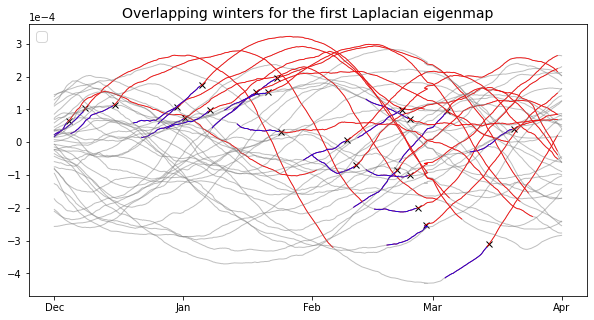

In [464]:
fig, ax = plt.subplots(1, figsize=(10, 5))
winters_supp(eigv_time_mean_nlsa,
             ax,
             1,
             eig=1,
             traj=traj_30_10,
             add_traj=True, y_ = {})
plt.title('Overlapping winters for the first Laplacian eigenmap')

### Multiplot: 

In [465]:
import matplotlib.collections as mcoll
import matplotlib.path as mpath

def colorline(x,
              y,
              ax,
              z=None,
              cmap=plt.get_cmap('copper'),
              norm=plt.Normalize(0.0, 1.0),
              linewidth=3,
              alpha=1.0):
    # Default colors equally spaced on [0,1]:
    if z is None:
        z = np.linspace(0.0, 1.0, len(x))
    # Special case if a single number:
    if not hasattr(
            z, "__iter__"):  # to check for numerical input -- this is a hack
        z = np.array([z])
    z = np.asarray(z)
    segments = make_segments(x, y)
    lc = mcoll.LineCollection(segments,
                              array=z,
                              cmap=cmap,
                              norm=norm,
                              linewidth=linewidth,
                              alpha=alpha)
    #ax = plt.gca()
    ax.add_collection(lc)
    return lc

def make_segments(x, y):
    """
    Create list of line segments from x and y coordinates, in the correct format
    for LineCollection: an array of the form numlines x (points per line) x 2 (x
    and y) array
    """
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    return segments

In [466]:
def add_arrow(line, position=None, direction='right', size=15, color=None, num_arrows = 5,linewidth=1, alpha=1):
    """
    add an arrow to a line.

    line:       Line2D object
    position:   x-position of the arrow. If None, mean of xdata is taken
    direction:  'left' or 'right'
    size:       size of the arrow in fontsize points
    color:      if None, line color is taken.
    """
    if color is None:
        color = line.get_color()

    xdata = line.get_xdata()
    ydata = line.get_ydata()

    min_ = xdata.min()
    max_ = xdata.max()
    if position is None:
        positions = np.linspace(min_, max_, num_arrows)
    # find closest index
    start_inds = [np.argmin(np.absolute(xdata - p)) for p in positions]
    if direction == 'right':
        end_inds = [start_ind + 1 for start_ind in start_inds]
    else:
        end_inds = [start_ind - 1 for start_ind in start_inds]
    for i in range(len(start_inds)):
        if start_inds[i] < len(xdata) and end_inds[i] < len(xdata): 
            line.axes.annotate('',
                               xytext=(xdata[start_inds[i]], ydata[start_inds[i]]),
                               xy=(xdata[end_inds[i]], ydata[end_inds[i]]),
                               arrowprops=dict(arrowstyle="->", color=color, linewidth=linewidth, alpha=alpha),
                               size=size)

In [467]:
eig_1 = eigv_time_mean[1]
eig_2 = eigv_time_mean[2]
eig_3 = eigv_time_mean[3]
eig_4 = eigv_time_mean[4]
eig_5 = eigv_time_mean[5]

eig_1_nlsa = eigv_time_mean_nlsa[1]
eig_2_nlsa = eigv_time_mean_nlsa[2]
eig_3_nlsa = eigv_time_mean_nlsa[3]
eig_4_nlsa = eigv_time_mean_nlsa[4]
eig_5_nlsa = eigv_time_mean_nlsa[5]

Save eigenvectors for geographical plots in other notebook:

In [468]:
plots_nlsa = [[0], [eig_2_nlsa, eig_1_nlsa], [eig_3_nlsa, eig_1_nlsa],
              [eig_4_nlsa, eig_1_nlsa], [eig_5_nlsa, eig_1_nlsa],
              [eig_1_nlsa, eig_2_nlsa], [0], [eig_3_nlsa, eig_2_nlsa],
              [eig_4_nlsa, eig_2_nlsa], [eig_5_nlsa, eig_2_nlsa],
              [eig_1_nlsa, eig_3_nlsa], [eig_2_nlsa, eig_3_nlsa], [0],
              [eig_4_nlsa, eig_3_nlsa], [eig_5_nlsa, eig_3_nlsa],
              [eig_1_nlsa, eig_4_nlsa], [eig_2_nlsa, eig_4_nlsa],
              [eig_3_nlsa, eig_4_nlsa], [0], [eig_5_nlsa, eig_4_nlsa],
              [eig_1_nlsa, eig_5_nlsa], [eig_2_nlsa, eig_5_nlsa],
              [eig_3_nlsa, eig_5_nlsa], [eig_4_nlsa, eig_5_nlsa], [0]]

#### Multiplot with all ssw:

In [469]:
def multiplot_allssw(eigv_time,
              plots,
              dates_,
              traj,
              colors_lines,
              colors_points,
              winters_no_ssw=winters_no_ssw,
              winters_ssw=winters_ssw):
    fig, axs = plt.subplots(5, 5, figsize=(20, 20))
    m = 0

    y_= {}
    for i in range(5):
        for j in range(5):
            pl = plots[m]
            if i != j:
                #plot grey lines:
                axs[i, j].plot(pl[0],
                               pl[1],
                               alpha=0.8,
                               color='grey',
                               linewidth=0.15)
                
                # add trajectories
                for year in traj:
                    if int(year) not in y_ and int(year) - 1 not in y_:
                        for el in traj[year]:
                            #type_ = el[1]
                            type_ = 'D'
                            winter_year_eig_0 = pl[0][el[0]]
                            winter_year_eig_1 = pl[1][el[0]]
                            line = axs[i, j].plot(winter_year_eig_0,
                                                  winter_year_eig_1,
                                                  linewidth=0.8,
                                                  color=colors_points[type_],
                                                  alpha=0.6)[0]
                            add_arrow(line,
                                      num_arrows=3,
                                      linewidth=0.8,
                                      alpha=0.5)
                axs[i, j].locator_params(axis='x', nbins=3)

            else:
                # diagonal plots
                winters_supp(eigv_time,
                             axs[i, j],
                             1,
                             i + 1,
                             alpha=0.4,
                             linewidth=1,
                             traj=traj,y_ = y_,
                             add_traj=True)
            if i == 0:
                axs[i, j].set_title(j + 1)
            if j == 0:
                axs[i, j].set_ylabel(i + 1)
            if j == 3 and i == 2:
                plt.rc('legend', fontsize=12)
                axs[i, j].legend(loc='lower right')
            m += 1

    plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


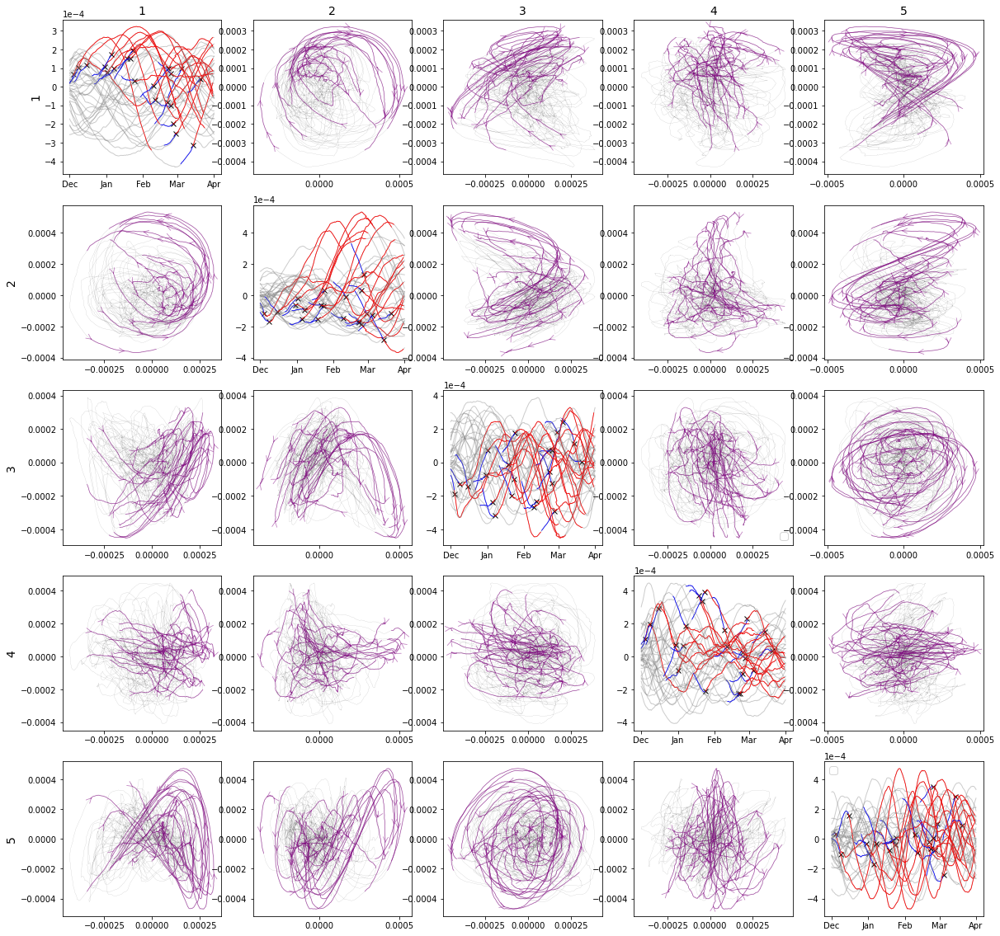

In [470]:
colors_lines ={'S':'darkblue', 'D':'darkred', 'D+S':'darkorange', 'N':'green'}
colors_points = {
    'D': 'purple',
    'D_TM': 'darkred',
    'S': 'deepskyblue',
    'S_TM': 'darkblue', 
    'SSW':'red', 
    'NO-SSW': 'black'
    
}

multiplot_allssw(eigv_time_mean_nlsa, plots_nlsa,dates_,traj_2months,colors_lines, colors_points);

#### Multiplot with clusters:

In [471]:
time_series = plots_nlsa[1][0].loc[jan_feb['cluster_label_spectral_kernel'].index]

clusters = jan_feb['cluster_label_spectral_kernel'].loc[time_series.index].values
LABEL_COLOR_MAP = {0 : 'red',
                   1 : 'green',
                   2:'blue',
                   }

label_color = [LABEL_COLOR_MAP[l] for l in clusters]

In [472]:
def multiplot_clusters(eigv_time,
                       plots,
                       dates_,
                       traj,
                       colors_lines,
                       colors_points,
                       winters_no_ssw=winters_no_ssw,
                       winters_ssw=winters_ssw):
    fig, axs = plt.subplots(5, 5, figsize=(20, 20))
    m = 0
    y_ = {}
    for i in range(5):
        for j in range(5):
            pl = plots[m]
            if i != j:
                #plot grey lines:
                axs[i, j].plot(pl[0],
                               pl[1],
                               alpha=0.8,
                               color='grey',
                               linewidth=0.15)

                time_series1 = pl[0].loc[jan_feb['cluster_label_spectral_kernel'].index]
                time_series2 = pl[1].loc[jan_feb['cluster_label_spectral_kernel'].index]
                clusters = jan_feb['cluster_label_spectral_kernel'].loc[
                    time_series2.index].values
                LABEL_COLOR_MAP = {
                    0: 'red',
                    1: 'green',
                    2: 'blue',
                }

                label_color = [LABEL_COLOR_MAP[l] for l in clusters]
                axs[i, j].scatter(time_series1,
                                  time_series2,
                                  alpha=0.3,
                                  c=label_color,
                                  s=2,
                                  linewidth=0.15)

                # add special trajectories:
                for y in y_:
                    winter_year = pd.date_range(f'{y}-12', f'{y+1}-04')
                    winter_year_eig_0 = pl[0][winter_year]
                    winter_year_eig_1 = pl[1][winter_year]
                    line = axs[i, j].plot(winter_year_eig_0,
                                          winter_year_eig_1,
                                          linewidth=1,
                                          color=colors_lines[y_[y]],
                                          label=f'{y}-{y+1}: {y_[y]}')[0]
                    add_arrow(line)

                for year in traj:
                    if int(year) not in y_ and int(year) - 1 not in y_:
                        for el in traj[year]:
                            type_ = el[1]
                            winter_year_eig_0 = pl[0][el[0]]
                            winter_year_eig_1 = pl[1][el[0]]
                            line = axs[i, j].plot(winter_year_eig_0,
                                                  winter_year_eig_1,
                                                  linewidth=0.8,
                                                  color='purple',
                                                  alpha=0.2)[0]
                            add_arrow(line,
                                      num_arrows=3,
                                      linewidth=0.8,
                                      alpha=0.2)
                axs[i, j].locator_params(axis='x', nbins=3)

            else:
                # diagonal plots
                winters_supp(eigv_time,
                             axs[i, j],
                             1,
                             i + 1,
                             alpha=0.4,
                             linewidth=1,
                             traj=traj,
                             y_=y_,
                             add_traj=False)
            if i == 0:
                axs[i, j].set_title(j + 1)
            if j == 0:
                axs[i, j].set_ylabel(i + 1)
            if j == 3 and i == 2:
                plt.rc('legend', fontsize=12)
                axs[i, j].legend(loc='lower right')
            m += 1

    plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


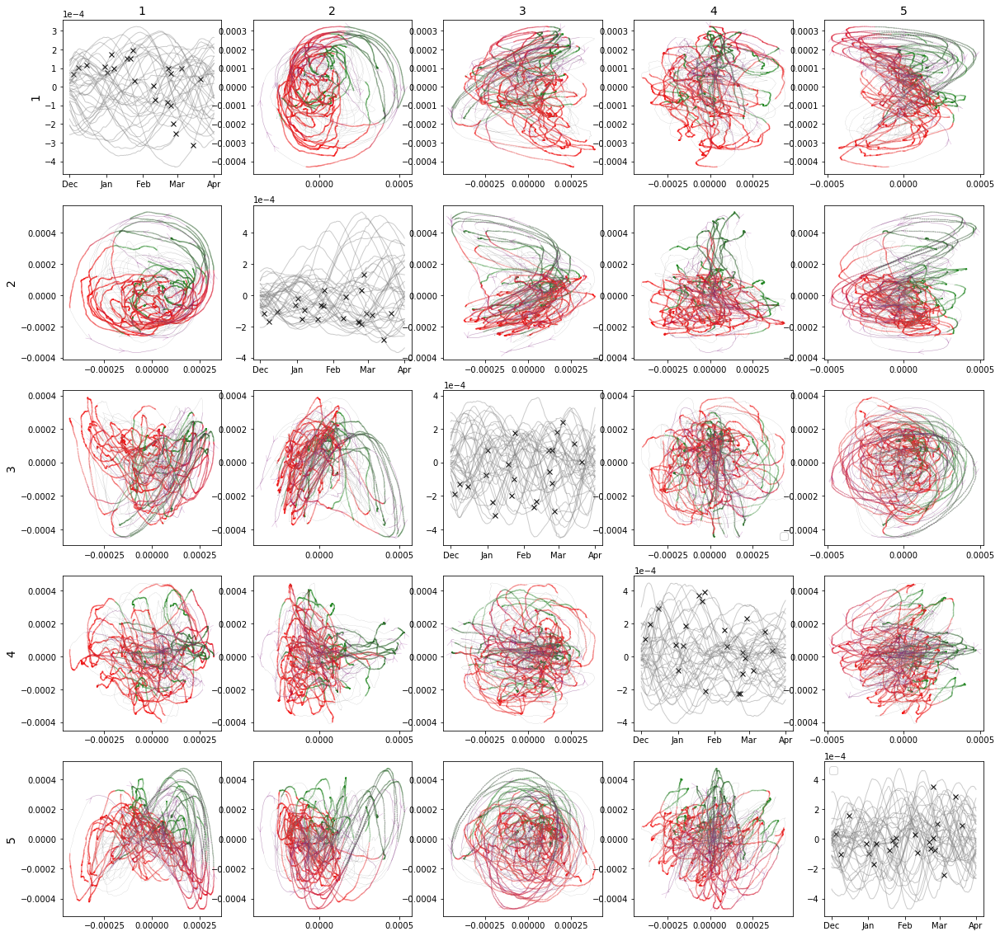

In [473]:
multiplot_clusters(eigv_time_mean_nlsa, plots_nlsa, dates_, traj_2months, colors_lines,
                   colors_points)

### Amplitude:

In [474]:
dates_ = []
for d in dates:
    dates_.append(pd.to_datetime(d[0]))
dates_[0]

Timestamp('1980-02-29 12:00:00')

In [475]:
from sklearn import preprocessing

def calculate_ampl(eig_1,eig_2):
    index = eig_1.index
    # then calculate radius:
    r = np.sqrt(eig_1**2 + eig_2**2)
    amplitude = pd.Series(r, index = index)
    return amplitude

In [476]:
def phase_two_points(x,y):
    a = np.sqrt(np.real(y)**2 + np.real(x)**2)
    arccos = np.real(x)/a
    arcsin = np.real(y)/a
    if arccos >= 0 and arcsin >= 0:
        phase = np.degrees(np.arccos(arccos))
    if arccos <= 0 and arcsin >= 0:
        phase = np.degrees(np.arccos(arccos))
    if arccos <= 0 and arcsin <= 0: 
        phase = - np.degrees(np.arccos(arccos))
    if arccos >= 0 and arcsin <= 0:
        phase = np.degrees(np.arcsin(arcsin))
    return phase

In [477]:
# theta = atan(y/x)
def calculate_phase(eig_1, eig_2):
    angles = []
    for i in range(len(eig_1)):
        angles.append(phase_two_points(eig_2[i],eig_1[i]))
    phase = pd.Series(angles, index = eig_1.index)
    return phase

In [478]:
def multiplot_ampl(eigv_time,
              plots,
              dates_,
              traj,
              colors_lines,
              colors_points,
              winters_no_ssw=winters_no_ssw,
              winters_ssw=winters_ssw):
    fig, axs = plt.subplots(5, 5, figsize=(20, 20))
    m = 0
    y_= {}
    for i in range(5):
        for j in range(5):
            pl = plots[m]
            
            if j > i:
                ind1 = pl[0].index
                ind2 = pl[1].index
                
                z_score_scaler1 = preprocessing.StandardScaler()
                z_score_scaler2 = preprocessing.StandardScaler()

                # standardize first: 
                z_score_scaler1.fit(np.real(pl[0]).reshape(-1, 1))
                z_score_scaler2.fit(np.real(pl[1]).reshape(-1, 1))
                
                eig_1 = z_score_scaler1.transform(np.real(pl[0]).reshape(-1, 1))
                eig_2 = z_score_scaler2.transform(np.real(pl[1]).reshape(-1, 1))
                
                eig_1 = pd.Series(eig_1.flatten(), index = ind1)
                eig_2 = pd.Series(eig_2.flatten(), index = ind2)
                
                amplitude = calculate_ampl(eig_1, eig_2)
                phase = calculate_phase(eig_1, eig_2)
                
                
                axs[i, j].scatter(phase, amplitude,
                               alpha=0.4,marker='x',s=4,
                               color='grey',
                               linewidth=0.15)
            
                    
                # add SSW
                for year in traj:
                    if int(year) not in y_ and int(year) - 1 not in y_:
                        for el in traj[year]:
                            winter_year_eig_0 = pl[0][el[0]]
                            winter_year_eig_1 = pl[1][el[0]]
                            
                            ind1 = winter_year_eig_0.index
                            ind2 = winter_year_eig_1.index
                            
                            winter_year_eig_0 = z_score_scaler1.transform(np.real(winter_year_eig_0).reshape(-1, 1))
                            winter_year_eig_1 = z_score_scaler2.transform(np.real(winter_year_eig_1).reshape(-1, 1))
                            
                            winter_year_eig_0 = pd.Series(winter_year_eig_0.flatten(), index = ind1)
                            winter_year_eig_1 = pd.Series(winter_year_eig_1.flatten(), index = ind2)

                            amplitude = calculate_ampl(winter_year_eig_0, winter_year_eig_1)
                            phase = calculate_phase(winter_year_eig_0, winter_year_eig_1)
                            axs[i, j].scatter(phase, amplitude,
                                           alpha=0.8,marker='x',s=8,
                                           color='red',
                                           linewidth=0.15)
                for year in traj_10:
                    if int(year) not in y_ and int(year) - 1 not in y_:
                        for el in traj_10[year]:
                            winter_year_eig_0 = pl[0][el[0]]
                            winter_year_eig_1 = pl[1][el[0]]
                            
                            ind1 = winter_year_eig_0.index
                            ind2 = winter_year_eig_1.index
                            
                            winter_year_eig_0 = z_score_scaler1.transform(np.real(winter_year_eig_0).reshape(-1, 1))
                            winter_year_eig_1 = z_score_scaler2.transform(np.real(winter_year_eig_1).reshape(-1, 1))
                            
                            winter_year_eig_0 = pd.Series(winter_year_eig_0.flatten(), index = ind1)
                            winter_year_eig_1 = pd.Series(winter_year_eig_1.flatten(), index = ind2)

                            amplitude = calculate_ampl(winter_year_eig_0, winter_year_eig_1)
                            phase = calculate_phase(winter_year_eig_0, winter_year_eig_1)
                            axs[i, j].scatter(phase, amplitude,
                                           alpha=0.8,marker='x',s=8,
                                           color='blue',
                                           linewidth=0.15)                           
                
                # add dates:
                for d in dates_:
                    e1, e2 = eig_1[d], eig_2[d]
                    angle = phase_two_points(e2, e1)
                    ampl = np.sqrt(e1**2 + e2**2)
                    axs[i,j].plot(angle,ampl,'x', color = 'black')
                
            
            if i > j:
                z_score_scaler1 = preprocessing.StandardScaler()
                z_score_scaler2 = preprocessing.StandardScaler()

                # standardize first: 
                z_score_scaler1.fit(np.real(pl[0]).reshape(-1, 1))
                z_score_scaler2.fit(np.real(pl[1]).reshape(-1, 1))
                
                eig_1 = z_score_scaler1.transform(np.real(pl[0]).reshape(-1, 1))
                eig_2 = z_score_scaler2.transform(np.real(pl[1]).reshape(-1, 1))
                
                #plot grey lines:
                axs[i, j].plot(eig_1,
                               eig_2,
                               alpha=1,
                               color='grey',
                               linewidth=0.15)
                
                # add trajectories
                for year in traj:
                    if int(year) not in y_ and int(year) - 1 not in y_:
                        for el in traj[year]:
                            #type_ = el[1]
                            type_ = 'D'
                            winter_year_eig_0 = pl[0][el[0]]
                            winter_year_eig_1 = pl[1][el[0]]
                            
                            winter_year_eig_0 = z_score_scaler1.transform(np.real(winter_year_eig_0).reshape(-1, 1))
                            winter_year_eig_1 = z_score_scaler2.transform(np.real(winter_year_eig_1).reshape(-1, 1))
                            
                            line = axs[i, j].plot(winter_year_eig_0,
                                                  winter_year_eig_1,
                                                  linewidth=0.8,
                                                  color=colors_points[type_],
                                                  alpha=0.6)[0]
                            add_arrow(line,
                                      num_arrows=3,
                                      linewidth=0.8,
                                      alpha=0.8)
                # - 10 days:
                for year in traj_10:
                    if int(year) not in y_ and int(year) - 1 not in y_:
                        for el in traj_10[year]:
                            winter_year_eig_0 = pl[0][el[0]]
                            winter_year_eig_1 = pl[1][el[0]]
                            
                            winter_year_eig_0 = z_score_scaler1.transform(np.real(winter_year_eig_0).reshape(-1, 1))
                            winter_year_eig_1 = z_score_scaler2.transform(np.real(winter_year_eig_1).reshape(-1, 1))
                            
                            line = axs[i, j].plot(winter_year_eig_0,
                                                  winter_year_eig_1,
                                                  linewidth=0.8,
                                                  color='blue',
                                                  alpha=0.6)[0]
                            add_arrow(line,
                                      num_arrows=3,
                                      linewidth=0.8,
                                      alpha=0.8)
                axs[i, j].locator_params(axis='x', nbins=5)
                
                
                
                for d in dates:
                    d_ = pd.to_datetime(d[0])
                    eig_0_d = pl[0][d_]
                    eig_1_d = pl[1][d_]
                    
                    eig_0_d = z_score_scaler1.transform(np.real(eig_0_d).reshape(-1, 1))
                    eig_1_d = z_score_scaler2.transform(np.real(eig_1_d).reshape(-1, 1))
                            
                    axs[i,j].plot(eig_0_d,eig_1_d,'x', color = 'black')
                #axs[i,j].set_xlim([0, ])
                
                axs[i,j].set_ylim([-np.max(np.abs(eig_2))-0.1, np.max(np.abs(eig_2))+0.1])
                axs[i,j].set_xlim([-np.max(np.abs(eig_1))-0.1, np.max(np.abs(eig_1))+0.1])

            if i == j:
                # diagonal plots
                winters_supp(eigv_time,
                             axs[i, j],
                             1,
                             i + 1,
                             alpha=0.4,
                             linewidth=1,
                             traj=traj,y_ = y_,
                             add_traj=True)
                #ax[i,j].ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
                
            if i == 0:
                axs[i, j].set_title(j + 1)
            if j == 0:
                axs[i, j].set_ylabel(i + 1)
            if j == 3 and i == 2:
                plt.rc('legend', fontsize=12)
                axs[i, j].legend(loc='lower right')
            m += 1

    plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


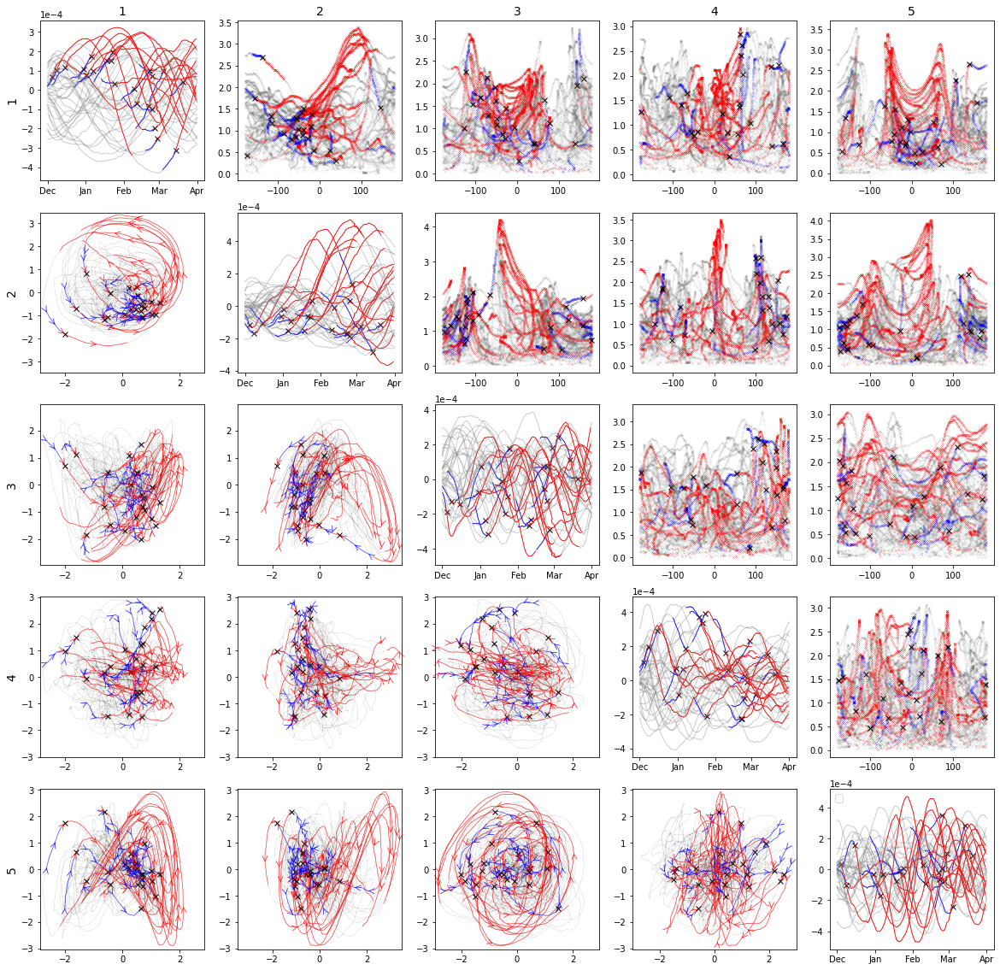

In [479]:
colors_lines = {
    'S': 'darkblue',
    'D': 'darkred',
    'D+S': 'darkorange',
    'N': 'green'
}
colors_points = {
    'D': 'red',
    'D_TM': 'darkred',
    'S': 'deepskyblue',
    'S_TM': 'darkblue',
    'SSW': 'red',
    'NO-SSW': 'black'
}

multiplot_ampl(eigv_time_mean_nlsa, plots_nlsa, dates_, traj_2months,
               colors_lines, colors_points)

For all trajectories number of points above threshold: 424
For ssw trajectories number of points above threshold: 424
Percentage: 100.0


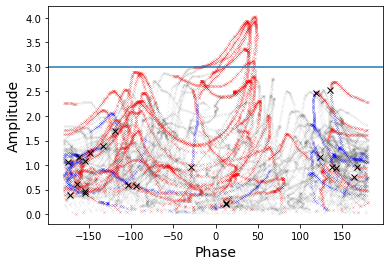

In [496]:
eig1 = eig_5_nlsa
eig2 = eig_2_nlsa

ind1 = eig1.index
ind2 = eig2.index
THRESH = 3

fig, axs = plt.subplots(1,1)
                
z_score_scaler1 = preprocessing.StandardScaler()
z_score_scaler2 = preprocessing.StandardScaler()
# standardize first: 
z_score_scaler1.fit(np.real(eig1).reshape(-1, 1))
z_score_scaler2.fit(np.real(eig2).reshape(-1, 1))
                
eig_1 = z_score_scaler1.transform(np.real(eig1).reshape(-1, 1))
eig_2 = z_score_scaler2.transform(np.real(eig2).reshape(-1, 1))
                
eig_1 = pd.Series(eig_1.flatten(), index = ind1)
eig_2 = pd.Series(eig_2.flatten(), index = ind2)
                
amplitude = calculate_ampl(eig_1, eig_2)
all_tresh = len(amplitude[amplitude>THRESH])

phase = calculate_phase(eig_1, eig_2)
axs.scatter(phase, amplitude,alpha=0.4,marker='x',s=4,
                               color='grey',
                               linewidth=0.15)
axs.axhline(THRESH)  
y_= {}
# add SSW
above_tresh = []

for year in traj_2months:
    if int(year) not in y_ and int(year) - 1 not in y_:
        for el in traj[year]:
            #type_ = el[1]
            type_ = 'D' 
            winter_year_eig_0 = eig1[el[0]]
            winter_year_eig_1 = eig2[el[0]]
                            
            ind1 = winter_year_eig_0.index
            ind2 = winter_year_eig_1.index
                            
            winter_year_eig_0 = z_score_scaler1.transform(np.real(winter_year_eig_0).reshape(-1, 1))
            winter_year_eig_1 = z_score_scaler2.transform(np.real(winter_year_eig_1).reshape(-1, 1))
                            
            winter_year_eig_0 = pd.Series(winter_year_eig_0.flatten(), index = ind1)
            winter_year_eig_1 = pd.Series(winter_year_eig_1.flatten(), index = ind2)

            amplitude = calculate_ampl(winter_year_eig_0, winter_year_eig_1)
            
            # Above threshold:
            above_tresh.append(len(amplitude[amplitude>THRESH]))
            
            phase = calculate_phase(winter_year_eig_0, winter_year_eig_1)
            axs.scatter(phase,amplitude,
                                    alpha=0.8,marker='x',s=8,
                                    color=colors_points['D'],
                                    linewidth=0.15)

# - 10 days:
for year in traj_10:
    if int(year) not in y_ and int(year) - 1 not in y_:
        for el in traj_10[year]:
            #type_ = el[1]
            type_ = 'D' 
            winter_year_eig_0 = eig1[el[0]]
            winter_year_eig_1 = eig2[el[0]]
                            
            ind1 = winter_year_eig_0.index
            ind2 = winter_year_eig_1.index
                            
            winter_year_eig_0 = z_score_scaler1.transform(np.real(winter_year_eig_0).reshape(-1, 1))
            winter_year_eig_1 = z_score_scaler2.transform(np.real(winter_year_eig_1).reshape(-1, 1))
                            
            winter_year_eig_0 = pd.Series(winter_year_eig_0.flatten(), index = ind1)
            winter_year_eig_1 = pd.Series(winter_year_eig_1.flatten(), index = ind2)

            amplitude = calculate_ampl(winter_year_eig_0, winter_year_eig_1)
            
            # Above threshold:
            above_tresh.append(len(amplitude[amplitude>THRESH]))
            
            phase = calculate_phase(winter_year_eig_0, winter_year_eig_1)
            axs.scatter(phase,amplitude,
                                    alpha=0.8,marker='x',s=8,
                                    color='blue',
                                    linewidth=0.15)  
for d in dates_:
    e1, e2 = eig_1[d], eig_2[d]
    angle = phase_two_points(e2, e1)
    ampl = np.sqrt(e1**2 + e2**2)
    axs.plot(angle,ampl,'x', color = 'black')
axs.set_ylabel('Amplitude')
axs.set_xlabel('Phase')    
# points above threshold for ssw:
ssw_tresh = np.sum(above_tresh)
print(f'For all trajectories number of points above threshold: {all_tresh}')
print(f'For ssw trajectories number of points above threshold: {ssw_tresh}')
print(f'Percentage: {ssw_tresh*100/all_tresh}')

In [497]:
# add SS
perc = []
number =[]
for thresh in np.linspace(start=2, stop=3, num=50):
    eig1 = eig_2_nlsa
    eig2 = eig_5_nlsa

    ind1 = eig1.index
    ind2 = eig2.index
    y_= {}

    z_score_scaler1 = preprocessing.StandardScaler()
    z_score_scaler2 = preprocessing.StandardScaler()
    # standardize first: 
    z_score_scaler1.fit(np.real(eig1).reshape(-1, 1))
    z_score_scaler2.fit(np.real(eig2).reshape(-1, 1))

    eig_1 = z_score_scaler1.transform(np.real(eig1).reshape(-1, 1))
    eig_2 = z_score_scaler2.transform(np.real(eig2).reshape(-1, 1))

    eig_1 = pd.Series(eig_1.flatten(), index = ind1)
    eig_2 = pd.Series(eig_2.flatten(), index = ind2)

    amplitude = calculate_ampl(eig_1, eig_2)
    all_tresh = len(amplitude[amplitude>thresh])

    above_tresh = []
    for year in traj_2months:
        if int(year) not in y_ and int(year) - 1 not in y_:
            for el in traj[year]:
                #type_ = el[1]
                type_ = 'D' 
                winter_year_eig_0 = eig1[el[0]]
                winter_year_eig_1 = eig2[el[0]]

                ind1 = winter_year_eig_0.index
                ind2 = winter_year_eig_1.index

                winter_year_eig_0 = z_score_scaler1.transform(np.real(winter_year_eig_0).reshape(-1, 1))
                winter_year_eig_1 = z_score_scaler2.transform(np.real(winter_year_eig_1).reshape(-1, 1))

                winter_year_eig_0 = pd.Series(winter_year_eig_0.flatten(), index = ind1)
                winter_year_eig_1 = pd.Series(winter_year_eig_1.flatten(), index = ind2)

                amplitude = calculate_ampl(winter_year_eig_0, winter_year_eig_1)

                # Above threshold:
                above_tresh.append(len(amplitude[amplitude>thresh]))
    # - 10 days:
    for year in traj_10:
        if int(year) not in y_ and int(year) - 1 not in y_:
            for el in traj_10[year]:
                #type_ = el[1]
                type_ = 'D' 
                winter_year_eig_0 = eig1[el[0]]
                winter_year_eig_1 = eig2[el[0]]

                ind1 = winter_year_eig_0.index
                ind2 = winter_year_eig_1.index

                winter_year_eig_0 = z_score_scaler1.transform(np.real(winter_year_eig_0).reshape(-1, 1))
                winter_year_eig_1 = z_score_scaler2.transform(np.real(winter_year_eig_1).reshape(-1, 1))

                winter_year_eig_0 = pd.Series(winter_year_eig_0.flatten(), index = ind1)
                winter_year_eig_1 = pd.Series(winter_year_eig_1.flatten(), index = ind2)

                amplitude = calculate_ampl(winter_year_eig_0, winter_year_eig_1)

                # Above threshold:
                above_tresh.append(len(amplitude[amplitude>thresh]))

                phase = calculate_phase(winter_year_eig_0, winter_year_eig_1)

    for d in dates_:
        e1, e2 = eig_1[d], eig_2[d]
        angle = phase_two_points(e2, e1)
        ampl = np.sqrt(e1**2 + e2**2)

    # points above threshold for ssw:
    ssw_tresh = np.sum(above_tresh)
    perc.append(ssw_tresh*100/all_tresh)
    number.append(ssw_tresh)
    print(f'Percentage: {ssw_tresh*100/all_tresh}')

Percentage: 45.91651542649728
Percentage: 46.33540372670807
Percentage: 46.98137443802184
Percentage: 47.44864148442677
Percentage: 48.16592389441207
Percentage: 49.03640256959315
Percentage: 49.92587101556709
Percentage: 50.880551301684534
Percentage: 51.821060965954075
Percentage: 52.706552706552706
Percentage: 53.121072475911184
Percentage: 53.63321799307958
Percentage: 54.38362260792167
Percentage: 54.8729792147806
Percentage: 56.2772661173049
Percentage: 57.36949846468782
Percentage: 58.19628647214854
Percentage: 59.26535087719298
Percentage: 60.34090909090909
Percentage: 61.910377358490564
Percentage: 63.04347826086956
Percentage: 64.43867618429591
Percentage: 64.96945010183299
Percentage: 66.07648725212465
Percentage: 66.41566265060241
Percentage: 67.59112519809825
Percentage: 68.96265560165975
Percentage: 69.6027633851468
Percentage: 70.08849557522124
Percentage: 71.21906507791017
Percentage: 72.37093690248565
Percentage: 73.25227963525836
Percentage: 74.57446808510639
Percenta

Text(0.5, 0, 'Threshold')

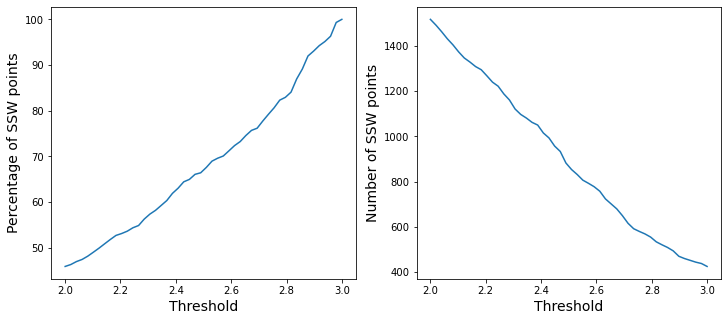

In [498]:
fig, axs = plt.subplots(1,2, figsize = (12,5))
axs[0].plot(np.linspace(start=2, stop=3, num=50), perc)
axs[0].set_ylabel('Percentage of SSW points')
axs[0].set_xlabel('Threshold')
axs[1].plot(np.linspace(start=2, stop=3, num=50), number)
axs[1].set_ylabel('Number of SSW points')
axs[1].set_xlabel('Threshold')

### Regions of 2D plots: 

In [348]:
time_nlsa= pd.read_csv(PATH_TAKENS + 'time_nlsa.csv')
time_nlsa['Date'] = pd.to_datetime(time_nlsa['Date'])
time_nlsa = time_nlsa.drop('Unnamed: 0', axis = 1)
pl = plots_nlsa[1]
df = pd.DataFrame(data = {'1': np.real(pl[0]), '2': np.real(pl[1])}, index = time_nlsa['Date'])
time_nlsa.shape

(23713, 1)

In [349]:
time_full = pd.read_csv(PATH_TAKENS + 'time_nlsa_full.csv')
time_full.drop(['Unnamed: 0'], axis = 1, inplace = True)
time_full['Date'] = pd.to_datetime(time_full['Date'])
time_full.shape

(23752, 1)

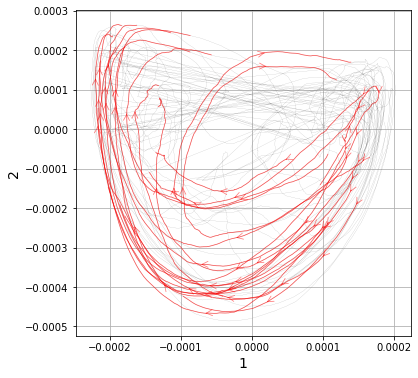

In [350]:
# create grid: 
pl = plots_nlsa[1]
#plot grey lines:
fig, axs = plt.subplots(1,1,figsize = (6,6))
axs.plot(pl[1],pl[0],alpha=0.8,
                               color='grey',
                               linewidth=0.15)
[ymin, ymax] = axs.get_ylim()
[xmin, xmax] = axs.get_xlim()

y_= {}
# add trajectories
for year in traj:
    if int(year) not in y_ and int(year) - 1 not in y_:
        for el in traj[year]:
            type_ = 'D'
            winter_year_eig_0 = pl[1][el[0]]
            winter_year_eig_1 = pl[0][el[0]]
            line = axs.plot(winter_year_eig_0, winter_year_eig_1,
                                                  linewidth=0.8,
                                                  color=colors_points[type_],
                                                  alpha=0.6)[0]
            add_arrow(line,num_arrows=3,
                                      linewidth=0.8,
                                      alpha=0.5)
            #axs.locator_params(axis='x', nbins=5)

axs.set_xlabel('1')
axs.set_ylabel('2')

axs.grid()

In [351]:
# For anomalies data:
xticks = axs.get_xticks()
yticks = axs.get_yticks()
gridsx = {}
gridsy = {}

for i in range(len(xticks)-1):
    gridsx[i+1] = xticks[i:i+2]
for i in range(len(yticks)-1):
    gridsy[i+1] = yticks[i:i+2]

gridcells_anom = [[gridsx[5], gridsy[7]], [gridsx[5], gridsy[6]],
             [gridsx[5], gridsy[5]], [gridsx[4], gridsy[3]],
             [gridsx[3], gridsy[2]], [gridsx[2], gridsy[3]],
             [gridsx[2], gridsy[4]], [gridsx[2], gridsy[5]],
             [gridsx[1], gridsy[6]], [gridsx[1], gridsy[7]],
             [gridsx[1], gridsy[8]]]

In [352]:
    
gridcells = [[gridsx[5], gridsy[7]], [gridsx[5], gridsy[6]],
             [gridsx[5], gridsy[5]], [gridsx[4], gridsy[3]],
             [gridsx[3], gridsy[2]], [gridsx[2], gridsy[3]],
             [gridsx[2], gridsy[4]], [gridsx[2], gridsy[5]],
             [gridsx[1], gridsy[6]], [gridsx[1], gridsy[7]],
             [gridsx[1], gridsy[8]]]

In [353]:
# For raw data:
xticks = axs.get_xticks()
yticks = axs.get_yticks()
gridsx = {}
gridsy = {}

for i in range(len(xticks)-1):
    gridsx[i+1] = xticks[i:i+2]
for i in range(len(yticks)-1):
    gridsy[i+1] = yticks[i:i+2]
    
gridcells = [[gridsx[5], gridsy[7]], [gridsx[5], gridsy[6]],
             [gridsx[5], gridsy[5]], [gridsx[4], gridsy[3]],
             [gridsx[3], gridsy[2]], [gridsx[2], gridsy[3]],
             [gridsx[2], gridsy[4]], [gridsx[2], gridsy[5]],
             [gridsx[1], gridsy[6]], [gridsx[1], gridsy[7]],
             [gridsx[1], gridsy[8]]]

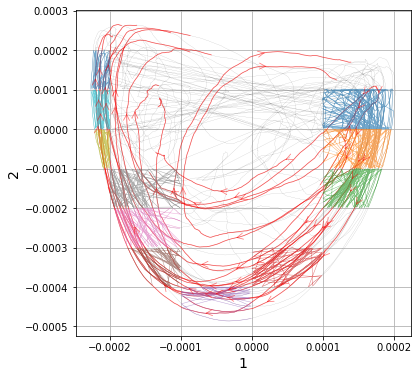

In [354]:
# create grid: 
pl = plots_nlsa[1]
#plot grey lines:
fig, axs = plt.subplots(1,1,figsize = (6,6))
axs.plot(pl[1],pl[0],alpha=0.8,
                               color='grey',
                               linewidth=0.15)
y_= {}
# add trajectories
for year in traj:
    if int(year) not in y_ and int(year) - 1 not in y_:
        for el in traj[year]:
            type_ = 'D'
            winter_year_eig_0 = pl[1][el[0]]
            winter_year_eig_1 = pl[0][el[0]]
            line = axs.plot(winter_year_eig_0, winter_year_eig_1,
                                                  linewidth=0.8,
                                                  color=colors_points[type_],
                                                  alpha=0.6)[0]
            add_arrow(line,num_arrows=3,
                                      linewidth=0.8,
                                      alpha=0.5)
axs.set_xlabel('1')
axs.set_ylabel('2')
axs.grid()

regions = []
for cell in gridcells:
    part = df[df['1'].between(cell[1][0], cell[1][1])]
    part = part[part['2'].between(cell[0][0], cell[0][1])]
    regions.append(part)

for region in regions:
    axs.plot(region['2'], region['1'],alpha = 0.6,
                    linewidth=0.5,
                    label=f'part {1}')

In [355]:
## get original data for that dates:
D = 150
takens_Y_df = pd.read_pickle(PATH1 + 'takens_Y_df_{}.pkl'.format(D))
print(takens_Y_df.shape)

## add time component:
takens_Y_ = pd.concat([time_full, takens_Y_df], axis=1)
takens_Y_ = takens_Y_.set_index('Date')

(23752, 36000)


In [356]:
## Get time of that regions:
patterns = np.zeros((len(regions), 36000))
for i in range(len(regions)):
    time_ = regions[i].index
    print(f'Length of dates in region {i}: {len(time_)}')
    patterns[i] = takens_Y_.loc[time_].mean()
patterns = pd.DataFrame(patterns)

Length of dates in region 0: 3938
Length of dates in region 1: 2003
Length of dates in region 2: 1061
Length of dates in region 3: 553
Length of dates in region 4: 359
Length of dates in region 5: 415
Length of dates in region 6: 664
Length of dates in region 7: 923
Length of dates in region 8: 292
Length of dates in region 9: 544
Length of dates in region 10: 674


In [357]:
## save pattern: 
patterns.to_csv(PATH_TAKENS+'pattern_eig1_eig2.csv')

### Power Spectrums:
Power spectrum plot for all years and then see something every 7 months

In [358]:
sampling_rate_seconds = 4 / (24 * 3600)
print(f'Frequency: {sampling_rate_seconds} [s-1]')
sampling_rate_days = 4
print(f'Frequency: {sampling_rate_days} [d-1]')
sampling_time = 1 / sampling_rate_days
print(f'Sampling every  {sampling_time*24} hours')
year_t = 365
two_year_t = (365 / 2)
three_year_t = (365 / 3)
freq_year = 1 / year_t
freq_two_year = 1 / two_year_t
freq_three_year = 1 / three_year_t

Frequency: 4.6296296296296294e-05 [s-1]
Frequency: 4 [d-1]
Sampling every  6.0 hours


Pperations on frequency : log(frequency) -> in time 1/frequency
indicate the 1/year, 2/year and 3/year frequencie

Estimate power spectral density using a periodogram. Change to 1/frequency to time.

In [359]:
"""
Power spectrum with zero padding for the missing dates:
"""
def pwr_compl(eigv_time, sampling_rate_days, number, axs):
    full_time = pd.date_range(start='1/1/1979', end='1/1/2019', freq='6H')
    full_df = pd.DataFrame(np.zeros((len(full_time), 20)))
    eigv_time = eigv_time.copy()
    full_df.index = full_time
    full_df.columns = [str(i) for i in eigv_time.columns]
    eigv_time.columns = [str(i) for i in eigv_time.columns]

    cols_to_use = full_df.transpose().columns.difference(
        eigv_time.transpose().columns)
    full_df_time = pd.merge(left=full_df.transpose()[cols_to_use],
                            right=eigv_time.transpose(),
                            how='right',
                            left_index=True,
                            right_index=True,
                            suffixes='_x').transpose()
    full_df_time = full_df_time.sort_index()
    f, Pxx_den = signal.periodogram(full_df_time[str(number)], sampling_rate_days)
    axs.semilogy(np.log(1 / f), Pxx_den)
    axs.axvline(np.log(year_t), color='r', linestyle=':', label='Every year')
    axs.axvline(np.log(two_year_t),
                color='g',
                linestyle=':',
                label='Twice per year')
    axs.axvline(np.log(three_year_t),
                color='orange',
                linestyle=':',
                label='Thrice per year')
    #axs.set_title("Powerspectrum of first eigenvector of Heat kernel")
    axs.set_xticklabels([])
    #axs.set_xlabel('Days')
    #axs.set_ylabel('log(time [d])')

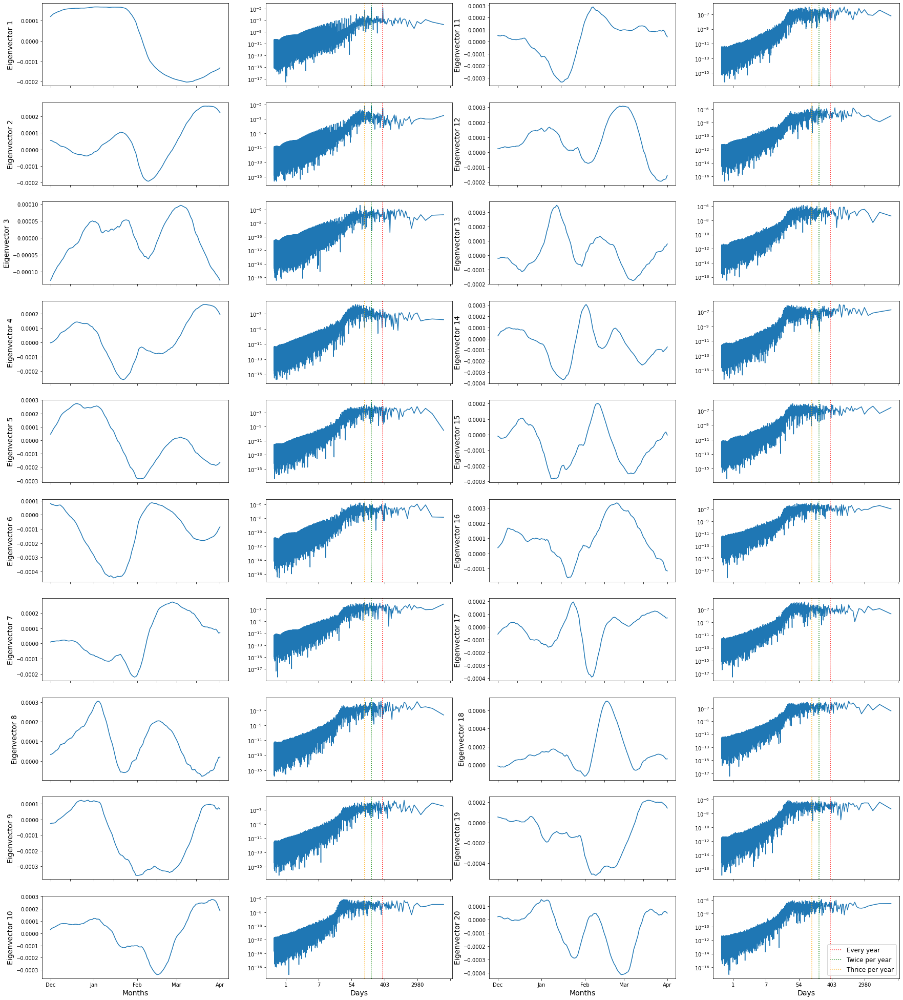

In [360]:
if DATA == 'raw':
    sign_mean = [0, 1, 1, -1, -1,1,1,1,1,1,1,1, 1, -1, -1,1,1,1,1,1,1]
    sign_simple = [0, 1, 1, -1, -1,-1,1,-1,1,1,1,1, 1, -1, -1,1,1,1,1,1,1]
    if USE_TAKENS:
        sign_mean = [0, 1, 1, -1, -1,1,1,1,1,1,1,1, 1, -1, -1,1,1,1,1,1,1]
        sign_simple = [0, 1, 1, 1, -1,-1,-1,1,-1,1,-1,-1, 1, 1, 1,-1,-1,1,1,1,1]
else:
    sign_mean = [0, 1, 1, -1, -1,1,1,1,1,1,1,1, 1, -1, -1,1,1,1,1,1,1]
    sign_simple = [0, 1, 1, 1, -1,1,1,1,-1,1,1,1, 1, 1, 1,1,1,-1,1,-1,-1]
    if USE_TAKENS:
        sign_mean = [0, 1, 1, -1, -1,1,1,1,1,1,1,1, 1, -1, -1,1,1,1,1,1,1]
        sign_simple = [0, -1, 1, 1, -1,-1,1,1,1,1,-1,1, 1, -1, 1,-1,1,-1,-1,1,1]
eigv_time_mean_nlsa =   eigv_time_mean_nlsa.drop('cluster_label_spectral_kernel', axis = 1) 
fig, axs = plt.subplots(10, 4, figsize=(30, 35))
m = 1
n = 1
for j in range(4):
    for i in range(10):
        if j==0 or j==2:
            winter_2008 = pd.date_range('2008-12', '2009-04')
            winter_2008_eig_mean = eigv_time_mean_nlsa[n][winter_2008]

            axs[i, j].plot(winter_2008_eig_mean.index,
                           sign_mean[n] * winter_2008_eig_mean.values,
                           label='heat kernel')

            axs[i, j].set_xticklabels([])
            axs[i, j].set_ylabel(f"Eigenvector {n}")
            if i==9:
                #axs[i, j].set_xticklabels(['Nov', 'Dec', 'Jan', 'Feb', 'Mar', 'Ap'])
                
                axs[i, j].set_xticks(
                ('2008'+ '-12', '2009' + '-01', '2009' + '-02',
                 '2009' + '-03', '2009' + '-04'))
                axs[i, j].set_xticklabels(['Dec', 'Jan', 'Feb', 'Mar', 'Apr'])
                axs[i,j].set_xlabel('Months')
            n += 1
        else:   
            pwr_compl(eigv_time_mean_nlsa, sampling_rate_days, m, axs[i,j])
            m+= 1
            if i==9:
                axs[i,j].set_xticklabels(['0', '1', '7', '54', '403', '2980'])
                axs[i,j].set_xlabel('Days')
plt.legend()

### Projection on geographical data: 
Perform projection $X'\in R^{1001x1}= X^T D \phi_i$. $X'_i = X D\phi_i \phi_i^T, \phi \in R^{33960}, X \in R^{Nx1001}$ 

In [361]:
%%time
chosen_t = 'mean'
if DATA == 'anomalies':
    if USE_TAKENS:
        print(f'Reading {DATA} data from {INPUT_DATA}')
        df = pd.read_csv(INPUT_DATA + 'anomalies_coefficients.csv', sep=',')
        print(f'Reading eigenvectors from {PATH1}')
        eigv = pd.read_pickle(PATH1 + 't_' + chosen_t +
                              '/takens/eigenvectors_heat_matrix_t_' +
                              chosen_t + '_takens_.pkl').values
        eigv = pd.DataFrame(eigv).drop([0], axis=1).values

    else:
        print(f'Reading {DATA} data from {INPUT_DATA}')
        df = pd.read_csv(INPUT_DATA + 'anomalies_coefficients.csv', sep=',')
        print(f'Reading eigenvectors from {PATH1}')
        eigv = pd.read_pickle(
            PATH1 + 't_mean/eigenvectors_heat_matrix_t_mean_.pkl').values
        eigv = pd.DataFrame(eigv).drop([0], axis=1).values

else:
    if USE_TAKENS:
        print(f'Reading {DATA} data from {INPUT_DATA}')
        df = pd.read_csv(INPUT_DATA + 'raw_data_coefficients.csv', sep=',')
        print(f'Reading eigenvectors from {PATH1}')
        eigv = pd.read_pickle(PATH1 + 't_' + chosen_t +
                              '/takens/eigenvectors_heat_matrix_t_' +
                              chosen_t + '_takens_.pkl').values
        eigv = pd.DataFrame(eigv).drop([1], axis=1).values
    else:
        print(f'Reading {DATA} data from {INPUT_DATA}')
        df = pd.read_csv(INPUT_DATA + 'raw_data_coefficients.csv', sep=',')
        print(f'Reading eigenvectors from {PATH1}')
        eigv = pd.read_pickle(
            PATH1 + 't_mean/eigenvectors_heat_matrix_t_mean_.pkl').values
        eigv = pd.DataFrame(eigv).drop([1], axis=1).values

print(f'Reading diagonal matrix from {PATH1}')
if USE_TAKENS:
    D = pd.read_pickle(PATH1 +
                       't_mean/takens/diagonal_heat_matrix_t_mean_takens_.pkl').values
    X = df.drop(['Unnamed: 0', 'Date'], axis=1)
    X_nlsa = X.loc[indices_of_points[0]]
    for i in range(1, len(last_pos_winters)):
        X_nlsa = pd.concat([X_nlsa, X.loc[indices_of_points[i]]], axis = 0)
    Xt = X_nlsa.values.transpose()
else:
    D = pd.read_pickle(PATH1 +
                       't_mean/diagonal_heat_matrix_t_mean_.pkl').values

    Xt = df.drop(['Unnamed: 0', 'Date'], axis=1).values.transpose()

print(f'Xt shape: {Xt.shape}')
print(f'Diagonal matrix shape: {D.shape}')
print(f'Eigenvectors shape: {eigv.shape}')

Reading raw data from ../../../data/vandermeer/input_data/
Reading eigenvectors from ../../../data/vandermeer/pickles/raw/10perc/
Reading diagonal matrix from ../../../data/vandermeer/pickles/raw/10perc/
Xt shape: (1001, 23752)
Diagonal matrix shape: (23752, 23752)
Eigenvectors shape: (23752, 20)
CPU times: user 6.24 s, sys: 4.34 s, total: 10.6 s
Wall time: 10.6 s


Projections on eigenvectors:

In [362]:
for i in range(NUM_EIGENVALUES-1):
    X_prime_i = Xt @ D @  eigv[:,i]
    np.save(PATH1 +'t_mean/takens/'+ 'X_prime_{}_takens_.npy'.format(i), X_prime_i)
    print('Saving X_prime_{}_takens_.npy at {}'.format(i, PATH1+'t_mean/takens/'))
del Xt, D, eigv

Saving X_prime_0_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_1_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_2_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_3_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_4_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_5_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_6_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_7_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_8_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_9_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens/
Saving X_prime_10_takens_.npy at ../../../data/vandermeer/pickles/raw/10perc/t_mean/takens

### Comments: 
- First request a lot of eigenvectors and check that only one eigenvector that has eigenvalue close to zero (~$10^{-15}$) and might need to increase number of neighbours otherwise (check if graph is connected): **DONE FOR 50 EIGENVALUES, ONLY ONE ZERO**
- Take the mean over all winters : **DONE**
- Change to heat kernel and compute for different kernel values, and more than 10 eigenvectors. Plot also the eigenvalues. **DONE**
- To choose t: look at distances and take mean or max of all distances among neighbours. Check if t is not the squared of distance. For large t we should have something close to what we have now. 
- Move to anomaly data
- Power spectrum with missing data ? Compute power spectrum for other eigenvectors. So up to 7 months alright and then a gap and the rest should start at 360 and multiply by $365/(7x30)$ **DONE**

- anomaly data estimated seasonality from raw data. estimate smooth mean and remove it to obtain the anomaly. 
- switch from default weight to gaussian kernel, optimise bandwidth computational demanding, try multiple experiments, assess the best bandwidth also define what best means
- apply also to anomaly data to see if consistent
- include to the model so that it can capture the dynamics of system, those things are called backends embedding (use multiple time steps to represent one sample -> sequences) —> apply and optimite previous all to new representation of data 

Pic raw data so that the first mode of variability should be the seasonality 
capturing something, huge variability but don’t know what

gaussian kernel approximates distance on manifold using this laplacian graph. The 0-1 weights is not very realistic because two samples that might be similar they might be different, For now they all have the sae weight. Not very good to approximate distances. For bandwidth t goes to 0 and a lot of data, converge to the distance on the manifold. 
